In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import random

from sklearn.preprocessing import StandardScaler, MinMaxScaler,OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.decomposition import PCA
from sklearn.feature_selection import  VarianceThreshold

import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Layer, BatchNormalization, Dropout
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

import torch
import torch.nn as nn
import torch.nn.functional as F


# Optional: torch_geometric for graph layers
try:
    from torch_geometric.nn import GATConv
    from torch_geometric.data import Data as GeoData
except Exception:
    GATConv = None
    GeoData = None

def set_seeds(seed=42):
    """
    Sets the seed for reproducibility across Python, NumPy, and TensorFlow.
    """
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    # For newer versions of TF/Keras to ensure deterministic behavior on GPU if possible
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    print(f"Random seed set to: {seed}")
set_seeds(42)


Random seed set to: 42


# 25-26


## Data Prep


In [37]:
data_25_26 = pd.read_csv('https://raw.githubusercontent.com/ilyandho/FPL-Optimal-Transfer/refs/heads/FantasyGo/Prediction%20with%20Affine%20PNN/data/rolled_player_data.csv')
gw=22

cols = [

    'fpl_id', 'round', 'fpl_name', 'position', 'team_id', 'team', 'opponent_team', 'was_home', 'xP', #'xP_next',
    'selected_by_percent','value', 'form', 'value_form', #'chance_of_playing_next_round', 'chance_of_playing_this_round',
    'transfers_in', 'transfers_out',  'selected', 'ownership_change', 'percenatge_net_transfers', 'cbitr_volume_90', 'cbitr_probability',
    'elo',  'team_h_difficulty', 'team_a_difficulty', #'strength', 'strength_overall_home', 'strength_overall_away', 'strength_attack_home', 'strength_attack_away', 'strength_defence_home',
    #'strength_defence_away',
    'win_prob', 'draw_prob', 'lose_prob',

    'creativity_1', 'creativity_3', 'creativity_5', 'influence_1', 'influence_3', 'influence_5', 'threat_1', 'threat_3', 'threat_5', 'minutes_1', 'minutes_3',
    'minutes_5', 'pts_bonus_1', 'pts_bonus_3', 'pts_bonus_5', 'expected_goals_1', 'expected_goals_3',
    'expected_goals_5', 'expected_assists_1', 'expected_assists_3', 'expected_assists_5', 'xP_1', 'xP_3', 'xP_5', 'expected_goals_conceded_1',
    'expected_goals_conceded_3', 'expected_goals_conceded_5', 'goals_conceded_1', 'goals_conceded_3', 'goals_conceded_5', 'goals_scored_1', 'goals_scored_3',
    'goals_scored_5', 'shots_1', 'shots_3', 'shots_5', 'key_passes_1', 'key_passes_3', 'key_passes_5', 'npg_1', 'npg_3', 'npg_5', 'npxG_1', 'npxG_3', 'npxG_5',
    'goals_1', 'goals_3', 'goals_5', 'xG_1', 'xG_3', 'xG_5', 'xA_1', 'xA_3', 'xA_5', 'saves_1', 'saves_3', 'saves_5', 'starts_1', 'starts_3', 'starts_5',
    'yellow_cards_1', 'yellow_cards_3', 'yellow_cards_5', 'red_cards_1', 'red_cards_3', 'red_cards_5', 'assists_1', 'assists_3', 'assists_5', 'clean_sheets_1',
    'clean_sheets_3', 'clean_sheets_5', 'value_1', 'value_3', 'value_5', 'ict_index_1', 'ict_index_3', 'ict_index_5', 'selected_1', 'selected_3', 'selected_5',
    'transfers_in_1', 'transfers_in_3', 'transfers_in_5', 'transfers_out_1', 'transfers_out_3', 'transfers_out_5', 'ownership_change_1', 'ownership_change_3',
    'ownership_change_5', 'percenatge_net_transfers_1', 'percenatge_net_transfers_3', 'percenatge_net_transfers_5', 'xGChain_1', 'xGChain_3', 'xGChain_5',
    'xGBuildup_1', 'xGBuildup_3', 'xGBuildup_5', 'expected_goal_involvements_1', 'expected_goal_involvements_3', 'expected_goal_involvements_5', 'form_1', 'form_3',
    'form_5', 'clearances_blocks_interceptions_1', 'clearances_blocks_interceptions_3', 'clearances_blocks_interceptions_5', 'tackles_1', 'tackles_3', 'tackles_5',
    'recoveries_1', 'recoveries_3', 'recoveries_5', 'selected_by_percent_1',
    'selected_by_percent_3', 'selected_by_percent_5', 'strength_1', 'strength_3', 'strength_5', 'strength_overall_home_1', 'strength_overall_home_3',
    'strength_overall_home_5', 'strength_overall_away_1', 'strength_overall_away_3', 'strength_overall_away_5', 'strength_attack_home_1', 'strength_attack_home_3',
    'strength_attack_home_5', 'strength_attack_away_1', 'strength_attack_away_3', 'strength_attack_away_5', 'strength_defence_home_1', 'strength_defence_home_3',
    'strength_defence_home_5', 'strength_defence_away_1', 'strength_defence_away_3', 'strength_defence_away_5',

    'opp_elo', 'opp_clean_sheets', 'opp_strength'
    ]


data_25_26 = data_25_26.rename({'web_name': 'fpl_name'}, axis=1)

data_25_26 = data_25_26[ (data_25_26['minutes_3'] >= 15) ] #(data_25_26['minutes_1'] > 0) |

active_data = data_25_26[cols].copy()
active_data_ = active_data.copy()


# active_data_['opponent_difficulty'] = active_data_.apply(
#     lambda row: (row['draw_prob'] + row['lose_prob'])
#     if row['was_home']
#     else (row['draw_prob'] + row['win_prob']),
#     axis=1
# )

# active_data_['team_difficulty'] = active_data_.apply(
#     lambda row: (row['draw_prob'] + row['lose_prob'])
#     if not row['was_home']
#     else (row['draw_prob'] + row['win_prob']),
#     axis=1
# )

CATEGORICAL_COLS = ['position', 'team', 'opponent_team']

# Initialize encoder
# handle_unknown='ignore' ensures new teams result in all-zero rows for those features
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Fit and transform the categorical columns
encoded_array = encoder.fit(active_data_[CATEGORICAL_COLS])

# Create a DataFrame with the encoded features
encoded_cols = encoder.get_feature_names_out(CATEGORICAL_COLS)
encoded_df = pd.DataFrame(
    encoder.transform(active_data_[CATEGORICAL_COLS]),
    columns=encoded_cols,
    index=active_data_.index
)


cols = [*cols, *encoded_cols]
# Combine with numerical data
active_data_ = pd.concat([active_data_, encoded_df], axis=1).drop(columns=CATEGORICAL_COLS)
active_data_

,fpl_id,round,fpl_name,team_id,was_home,xP,selected_by_percent,value,form,value_form,...,opponent_team_11.0,opponent_team_12.0,opponent_team_13.0,opponent_team_14.0,opponent_team_15.0,opponent_team_16.0,opponent_team_17.0,opponent_team_18.0,opponent_team_19.0,opponent_team_20.0
3,1.0,4,Raya,1.0,True,6.5,23.5,55.0,6.0,1.1,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,1.0,5,Raya,1.0,True,4.0,24.0,55.0,4.0,0.7,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,1.0,6,Raya,1.0,False,3.3,26.2,56.0,3.3,0.6,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
6,1.0,7,Raya,1.0,True,4.5,27.7,56.0,4.0,0.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
7,1.0,8,Raya,1.0,False,5.2,28.6,57.0,4.7,0.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6692,749.0,21,Mané,20.0,False,5.0,0.7,45.0,5.0,1.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6693,749.0,22,Mané,20.0,True,0.0,0.8,45.0,5.0,1.1,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
6738,783.0,22,Groß,6.0,True,0.0,0.0,55.0,1.0,0.2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6748,791.0,22,Taty,19.0,False,0.0,0.0,55.0,2.0,0.4,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


### Functions


In [ ]:
# --- Step 1: Data Preparation Function ---
def prepare_fpl_data(data, cols):
    """
    Prepares features (X), conditional parameters (M), targets (Y),
    and gameweeks (GW) for the AffinePNN model.
    """
    cols_ = list(cols)
    # if 'team_difficulty' not in cols_:
    #     cols_.append('team_h_difficulty', 'team_a_difficulty')

    data_ = data.copy()

    # Target and metadata columns
    target_col = ['xP', 'fpl_name', ]
    gameweek_col = 'round'
    POSITION_COL = 'position'
    M_COLS = ['was_home', 'position_DEF', 'position_FWD', 'position_GK', 'position_MID','win_prob', 'draw_prob', 'lose_prob'] #, 'whh', 'whd', 'wha'

    # 2. Target Variable (Y)
    Y = data_[target_col].fillna(0)

    # 3. Input Features (X)
    EXCLUDE_COLS = [*target_col, gameweek_col, *M_COLS]

    # Find position-related columns for explicit inclusion if needed
    new_position_cols = [col for col in data_.columns if col.startswith(f'{POSITION_COL}_')]

    # Filter feature columns
    X_cols = [c for c in data_.columns if c not in EXCLUDE_COLS and c != POSITION_COL]

    # Final check of column existence
    X_cols = [col for col in X_cols if col in data_.columns]

    # Convert to numpy
    X_ids = data_['fpl_id'].values
    X = data_[X_cols].drop(columns=['fpl_id', 'team_id'])
    X = X.fillna(0).values.astype(np.float32)

    M = data_[M_COLS].fillna(0).values.astype(np.float32)
    GW = data_[gameweek_col].values



    print(f"Data prepared. X shape: {X.shape}, M shape: {M.shape}, Y shape: {Y.shape}")
    return X, M, Y, GW, X_cols, X_ids

def transform_data(final_df, cols, round):
    # Prepare data
    X_full, M_full, Y_full, GW_full, X_cols, X_ids = prepare_fpl_data(final_df, cols)
    # print(X_full.shape)
    # Split
    GW_TRAIN_END = round - 1
    GW_TRAIN_START = GW_TRAIN_END - 10
    train_mask = (GW_full >= GW_TRAIN_START) & (GW_full <= GW_TRAIN_END)
    test_mask = GW_full == (GW_TRAIN_END + 1)

    X_train, M_train, Y_train_raw = X_full[train_mask], M_full[train_mask], Y_full[train_mask]
    X_test, M_test, Y_test_raw, X_test_ids = X_full[test_mask], M_full[test_mask], Y_full[test_mask], X_ids[test_mask]

    Y_train = Y_train_raw['xP'].values
    Y_train_names = Y_train_raw['fpl_name'].values

    Y_test = Y_test_raw['xP'].values
    Y_test_names = Y_test_raw['fpl_name'].values

    # Scaling
    scaler_x = StandardScaler()
    X_train_scaled = scaler_x.fit_transform(X_train)

    if X_test.size > 0:
        X_test_scaled = scaler_x.transform(X_test)
    else:
        X_test_scaled = scaler_x

    scaler_m = StandardScaler()
    M_train_scaled = scaler_m.fit_transform(M_train)

    if M_test.size > 0:
        M_test_scaled = scaler_m.transform(M_test)
    else:
        M_test_scaled = scaler_m

    # Scale Y if needed
    scaler_y = MinMaxScaler()
    Y_train_scaled = scaler_y.fit_transform(Y_train.reshape(-1, 1)).flatten()

    # print('----', Y_train)

    return (X_train_scaled, M_train_scaled, train_mask, Y_train, Y_train_names), (X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names, X_test_ids), GW_full, X_cols, scaler_y#, scaler_x, scaler_m


In [39]:

# --- Step 2: Custom Affine Conditioning Layer ---
class AffineConditioning(Layer):
    """
    Custom Keras Layer implementing the core Affine Parametric Neural Network (AffinePNN) logic.
    z = (phi * m + s0) * x + (psi * m + b0)
    """
    def __init__(self, units, activation=None, **kwargs):
        super(AffineConditioning, self).__init__(**kwargs)
        self.units = units
        self.activation = tf.keras.activations.get(activation)

    def build(self, input_shape):
        # input_shape: [feature_input_shape, parameter_input_shape]
        feature_dim = input_shape[0][-1]
        param_dim = input_shape[1][-1]

        # Weights to transform the parameter 'm' into scale and bias adjustments
        # Shape is (param_dim, feature_dim) to map conditions to feature space
        self.phi = self.add_weight(shape=(param_dim, feature_dim),
                                   initializer='glorot_uniform', trainable=True, name='phi')
        self.psi = self.add_weight(shape=(param_dim, feature_dim),
                                   initializer='glorot_uniform', trainable=True, name='psi')

        # Base scaling and bias
        # self.s0 = self.add_weight(shape=(feature_dim,), initializer='ones', trainable=True, name='s0')
        self.b0 = self.add_weight(shape=(feature_dim,), initializer='zeros', trainable=True, name='b0')

        self.built = True

    def call(self, inputs):
        x_in, m = inputs # x_in: (batch, feat), m: (batch, cond)

        # Calculate scale and bias based on conditional input m
        # (batch, cond) @ (cond, feat) -> (batch, feat)
        s_m = tf.matmul(m, self.phi)
        b_m = tf.matmul(m, self.psi)

        s = 1.0 + 0.5 * tf.tanh(s_m) # s_m + self.s0
        b = b_m + self.b0

        # Apply affine transformation
        x_out = s * x_in + b

        if self.activation is not None:
            return self.activation(x_out)
        return x_out

    def get_config(self):
        config = super(AffineConditioning, self).get_config()
        config.update({
            'units': self.units,
            'activation': tf.keras.activations.serialize(self.activation),
        })
        return config

# --- Step 3: Model Architecture ---
def build_affine_pnn(input_dim_x, input_dim_m, output_dim_y, hidden_units=128):
    """
    Builds the Affine Parametric Neural Network (AffinePNN) Model.
    """
    L2_REG = 0.005
    DROPOUT_RATE = 0.15

    X_input = Input(shape=(input_dim_x,), name='X_input')
    M_input = Input(shape=(input_dim_m,), name='M_input')

    # Initial Dense Layer
    x = Dense(hidden_units, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(L2_REG), name='Dense_1')(X_input)
    x = BatchNormalization()(x)
    # Affine Conditioning Block 1
    x = AffineConditioning(units=hidden_units, activation='tanh', name='Affine_Cond_1')([x, M_input])
    x = Dropout(DROPOUT_RATE)(x) # Added dropout for better generalization

    # Standard Dense Layer
    x = Dense(hidden_units // 2, activation='relu',
              kernel_regularizer=tf.keras.regularizers.l2(L2_REG), name='Dense_2')(x)

    # Affine Conditioning Block 2
    x = AffineConditioning(units=hidden_units // 2, activation='relu', name='Affine_Cond_2')([x, M_input])

    # Final Prediction Layer
    output = Dense(output_dim_y,
                activation='sigmoid',
                name='Output')(x)

    model = Model(inputs=[X_input, M_input], outputs=output, name='AffinePNN_FPL')
    return model

def plot_training_history(history):
    """
    Plots the training and validation loss/metrics including MSE.
    """
    metrics = ['loss', 'mae', 'mse']
    plt.figure(figsize=(18, 5))

    for i, metric in enumerate(metrics):
        plt.subplot(1, 3, i + 1)
        plt.plot(history.history[metric], label='Train')
        plt.plot(history.history[f'val_{metric}'], label='Validation')
        plt.title(f'Model {metric.upper()}')
        plt.xlabel('Epoch')
        plt.ylabel(metric.upper())
        plt.legend()
        plt.grid(True, linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()

def apnn_trainer(data, cols, round):
    train_data, test_data , GW_full, X_cols,scaler_y = transform_data(data, cols, round)
    X_train_scaled, M_train_scaled, train_mask, Y_train, _ = train_data
    X_test_scaled, M_test_scaled, test_mask, Y_test, Y_test_names, X_test_ids = test_data


    # Reduce features with low variance (nearly constant)
    vt = VarianceThreshold(threshold=1e-4)
    X_train_clean = vt.fit_transform(X_train_scaled)
    X_test_clean = vt.transform(X_test_scaled)

    pca = PCA(n_components=0.80)  # keep 95% variance
    X_train_pca = pca.fit_transform(X_train_clean)
    X_test_pca = pca.transform(X_test_clean)

    y_min, y_max = Y_train.min(), Y_train.max()

    # training
    y_train_scaled = (Y_train - y_min) / (y_max - y_min)

    Y_test_scaled = (Y_test - y_min) / (y_max - y_min)


    # Model Setup
    INPUT_DIM_X = X_train_pca.shape[1]
    INPUT_DIM_M = M_train_scaled.shape[1]
    OUTPUT_DIM_Y = 1

    model = build_affine_pnn(INPUT_DIM_X, INPUT_DIM_M, OUTPUT_DIM_Y)
    model.compile(optimizer=Adam(learning_rate=0.0001, clipnorm=1.0), loss='mse', metrics=['mae', 'mse'])

    # Callbacks
    # 1. Reduce Learning Rate on Plateau
    # Helps the model 'settle' into the global minimum during the final epochs.
    lr_reducer = tf.keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=0.5, patience=5, min_lr=1e-4, verbose=1
    )

    # 2. Early Stopping
    # Prevents overfitting by stopping once validation performance stops improving.
    early_stopper = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss', patience=10, min_delta=1e-4, restore_best_weights=True, verbose=1
    )

    # Training
    print("\nStarting Training...")
    history = model.fit(
        [X_train_pca, M_train_scaled], y_train_scaled,
        epochs=100, # Increased epochs with early stopping
        batch_size=32,
        validation_split=0.2,
        callbacks=[lr_reducer, early_stopper],
        verbose=1
    )

    evaluation_metrics = evaluator(model, X_test_pca, M_test_scaled, Y_test_scaled)

    # Prediction
    print("\nGenerating Predictions...")
    Y_pred_scaled = model.predict([X_test_pca, M_test_scaled]).flatten()

    # inference
    Y_pred = Y_pred_scaled * (y_max - y_min) + y_min

    position = active_data['position'][test_mask]
    teams = active_data['team'][test_mask]
    players_preds = {'fpl_name': Y_test_names, 'fpl_id': X_test_ids, 'team': teams, 'position': position, 'Actual_xP': Y_test, 'Predicted_xP': Y_pred}
    preds_df = pd.DataFrame(players_preds)

    return history, evaluation_metrics, preds_df

def evaluator(model, X_test_scaled, M_test_scaled, Y_test):
    # 1. EVALUATE TEST SET PERFORMANCE using model.evaluate
    print("\nEvaluating test set performance...")
    test_results = model.evaluate([X_test_scaled, M_test_scaled], Y_test, return_dict=True, verbose=0)

    # Generate predictions to calculate R2 score manually
    Y_pred = model.predict([X_test_scaled, M_test_scaled]).flatten()
    r2 = r2_score(Y_test, Y_pred)

    evaluation_metrics = {
        'test_loss': test_results['loss'],
        'test_mae': test_results['mae'],
        'test_mse': test_results['mse'],
        'test_R2': r2
    }


    return evaluation_metrics

def plot_preds(preds_df, position, gw):
    Y_test_names = preds_df[preds_df['position'] == position]['fpl_name'].values
    Y_test = preds_df[preds_df['position'] == position]['Actual_xP'].values
    Y_pred = preds_df[preds_df['position'] == position]['Predicted_xP'].values

    # Convert names to positions on x-axis
    x = np.arange(len(Y_test_names))

    plt.figure(figsize=(14, 6))

    # Plot actual points
    plt.plot(x, Y_test, marker='o', linewidth=2, label='Actual Points')

    # Plot predicted points
    plt.plot(x, Y_pred, marker='x', linewidth=2, label='Predicted Points')

    # Improve readability
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.xlabel("Players")
    plt.ylabel("Points")
    plt.title(f" {position} : Actual vs Predicted Points per Player for position(GW {gw})")
    plt.legend()
    plt.tight_layout()

    plt.show()

    # Index positions for players
    x = np.arange(len(Y_test_names))

    # Width of each bar
    width = 0.31

    plt.figure(figsize=(14, 6))

    # Bars
    plt.bar(x - width/2, Y_test, width, label='Actual Points')
    plt.bar(x + width/2, Y_pred, width, label='Predicted Points')

    # Labels & formatting
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.xlabel("Players")
    plt.ylabel("Points")
    plt.title(f" {position} : Actual vs Predicted Points per Player for position(GW {gw})")
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Calculate absolute errors
    errors = np.abs(Y_test - Y_pred)

    # Index for players
    x = np.arange(len(Y_test_names))
    width = 0.31  # width of the bars

    plt.figure(figsize=(16, 6))

    # Plot Actual and Predicted points side-by-side
    plt.bar(x - width/2, Y_test, width, label='Actual Points', color='skyblue')
    plt.bar(x + width/2, Y_pred, width, label='Predicted Points', color='salmon')

    # Annotate absolute errors on top of predicted bars
    for i in range(len(Y_test_names)):
        plt.text(x[i] + width/2, Y_pred[i] + 0.1, f"{errors[i]:.2f}", ha='center', va='bottom', fontsize=8, rotation=90)

    # Labels and formatting
    plt.xticks(x, Y_test_names, rotation=75, ha='right')
    plt.ylabel("Points")
    plt.title(f"{position}: Actual vs Predicted Points per Player (with Absolute Error) (GW {gw})")
    plt.legend()
    plt.tight_layout()

    plt.show()


## Predictions


### GW 16


Data prepared. X shape: (4706, 195), M shape: (4706, 8), Y shape: (4706, 2)

Starting Training...
Epoch 1/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - loss: 1.0000 - mae: 0.4957 - mse: 0.2796 - val_loss: 0.9348 - val_mae: 0.4704 - val_mse: 0.2444 - learning_rate: 1.0000e-04
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.8435 - mae: 0.3601 - mse: 0.1624 - val_loss: 0.7786 - val_mae: 0.3226 - val_mse: 0.1254 - learning_rate: 1.0000e-04
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7266 - mae: 0.2402 - mse: 0.0828 - val_loss: 0.6689 - val_mae: 0.1994 - val_mse: 0.0533 - learning_rate: 1.0000e-04
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6489 - mae: 0.1648 - mse: 0.0428 - val_loss: 0.6027 - val_mae: 0.1318 - val_mse: 0.0251 - learning_rate: 1.0000e-04
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5945 - mae: 0.1275 - mse: 0.0265 - val_loss: 0.5551 - val_mae: 0.1018 - val_mse: 0.0154 - learning_rate: 1.0000e-04
Epoch 6/100
70/7

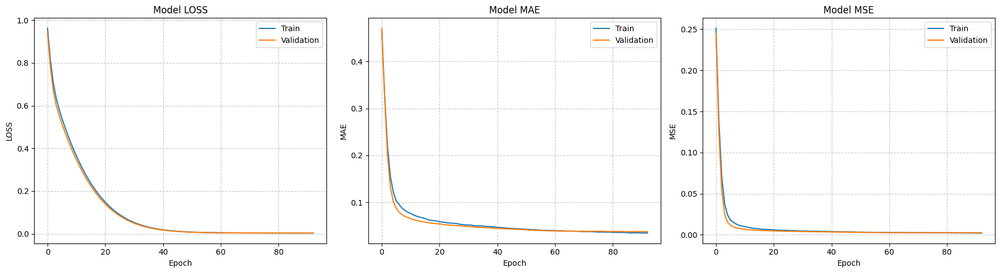


--- Final Test Set Evaluation (GW 22) ---
R²: 0.7927174638852823
MAE: 0.0426691435277462
MSE: 0.0031130234710872
Loss: 0.0044112987816334

--- Results for Gameweek 16 ---


,fpl_name,fpl_id,team,position,Actual_xP,Predicted_xP
3730,Foden,414.0,Man City,MID,11.9,9.543574
2933,Wilson,329.0,Fulham,MID,8.8,9.381751
1940,Chalobah,226.0,Chelsea,DEF,7.2,7.986759
4087,B.Fernandes,449.0,Man Utd,MID,9.6,7.947419
237,Merino,22.0,Arsenal,MID,6.8,7.936857
...,...,...,...,...,...,...
1472,Ayari,166.0,Brighton,MID,1.1,0.983693
6216,Tchatchoua,695.0,Wolves,DEF,0.2,0.967549
6291,Justin,706.0,Leeds,DEF,0.6,0.841333
5706,Gomes,646.0,Wolves,MID,1.6,0.823202


In [40]:
history_16, evaluation_metrics_16, preds_df_16 = apnn_trainer(active_data_, cols, 16)
# Plot History
plot_training_history(history_16)

# EVALUATE TEST SET PERFORMANCE
print(f"\n--- Final Test Set Evaluation (GW {gw}) ---")
print(f"R²: {evaluation_metrics_16['test_R2']:.16f}")
print(f"MAE: {evaluation_metrics_16['test_mae']:.16f}")
print(f"MSE: {evaluation_metrics_16['test_mse']:.16f}")
print(f"Loss: {evaluation_metrics_16['test_loss']:.16f}")


print("\n--- Results for Gameweek 16 ---")
preds_df_16.sort_values(by='Predicted_xP', ascending=False)#.#head(10).round(2).to_string(index=False))



#### Plots


###### GK


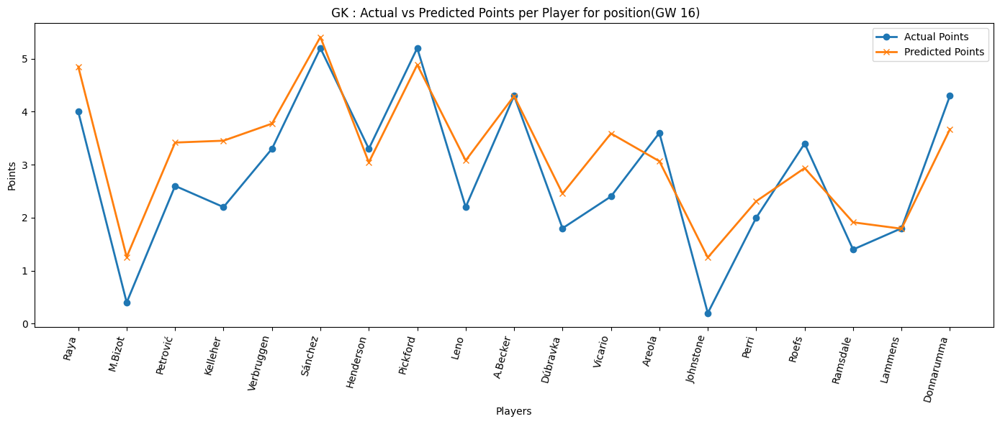

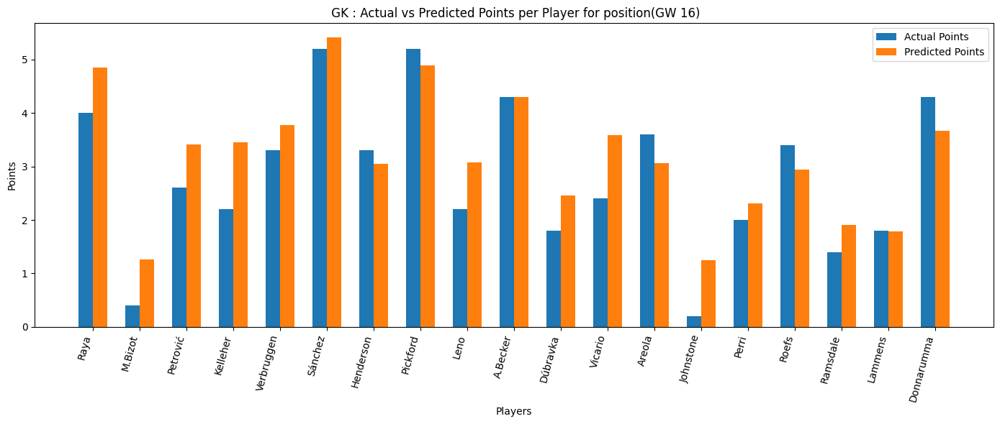

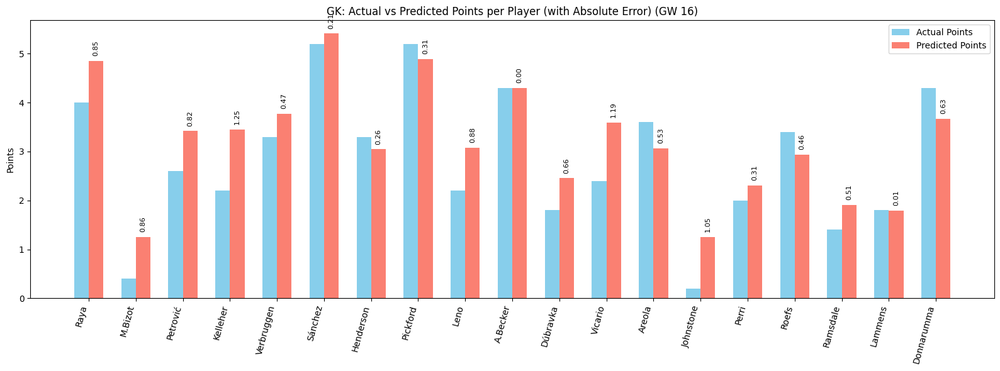

In [34]:
plot_preds(preds_df_16, 'GK', 16)


###### DEF


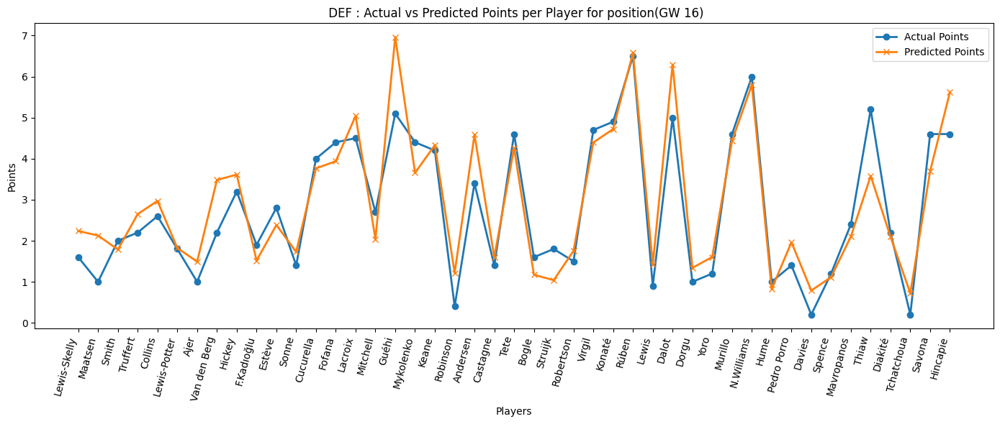

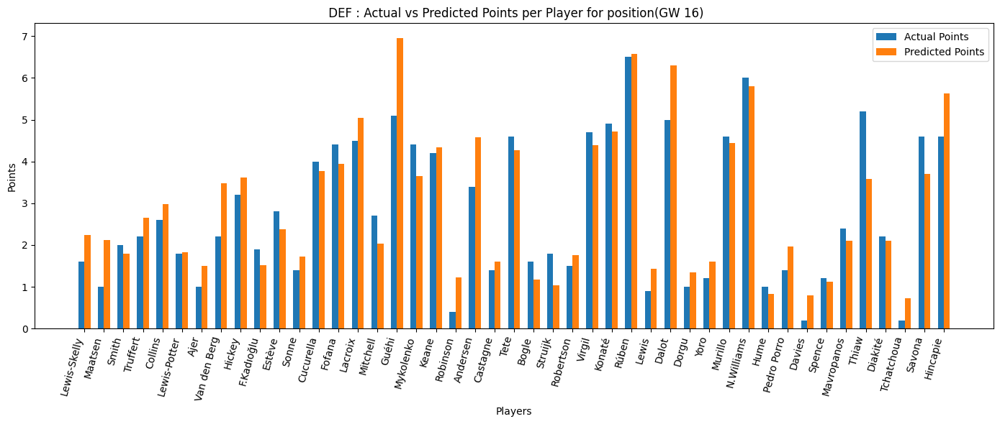

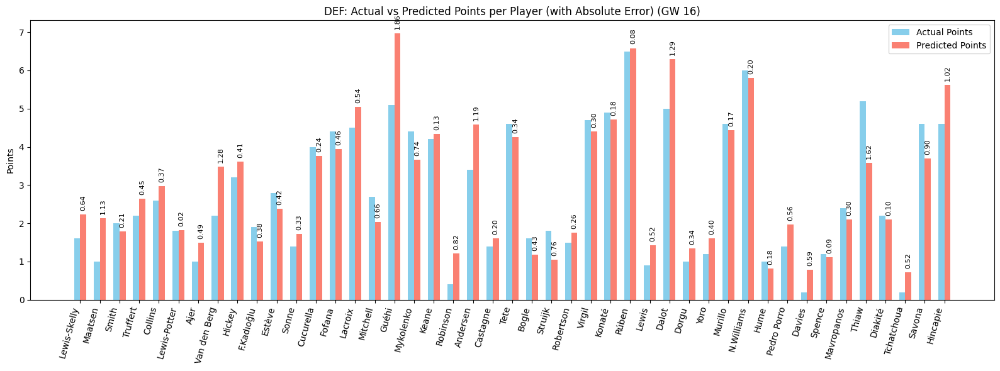

In [14]:
plot_preds(preds_df_16, 'DEF', 16)

###### MID


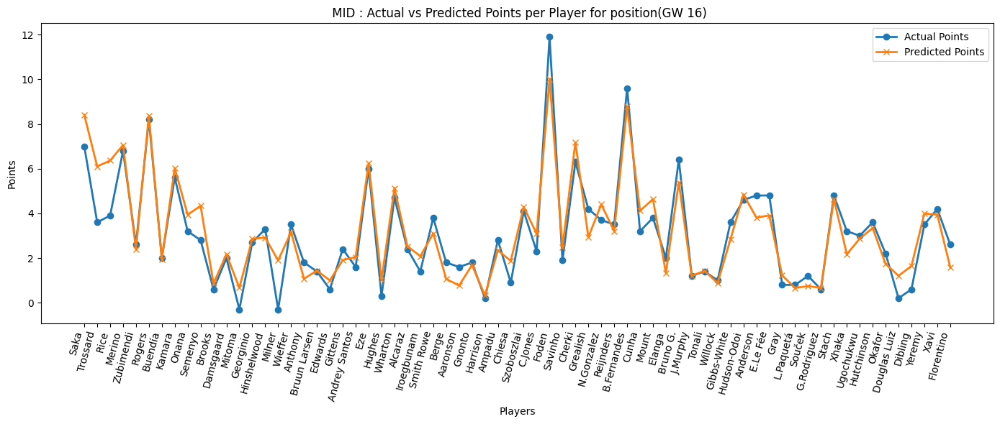

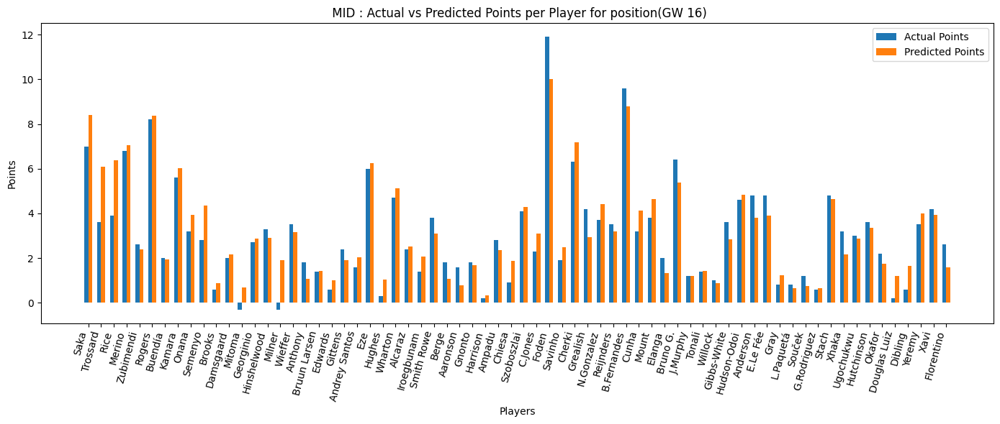

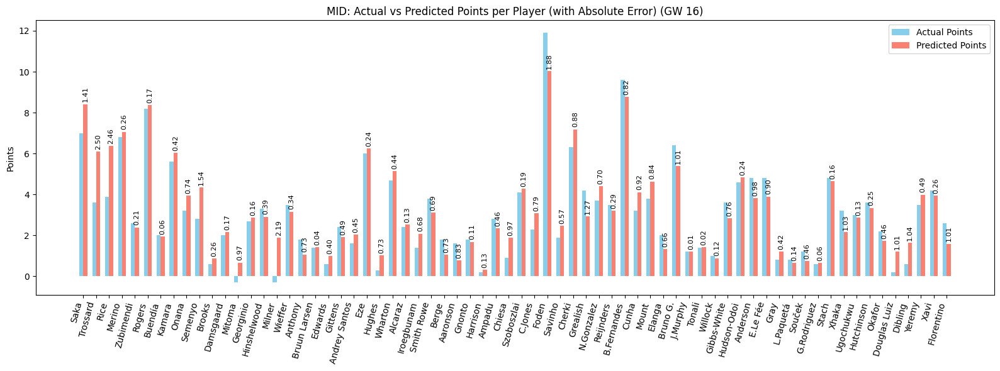

In [15]:
plot_preds(preds_df_16, 'MID', 16)

###### FWD


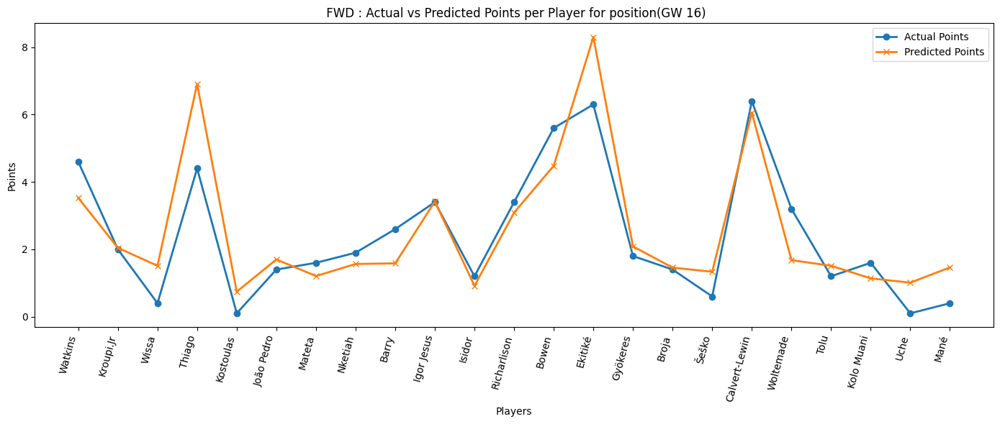

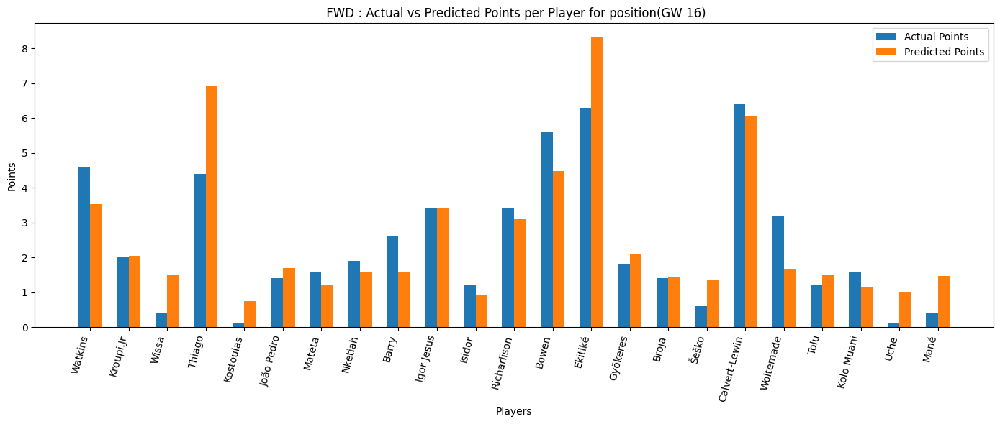

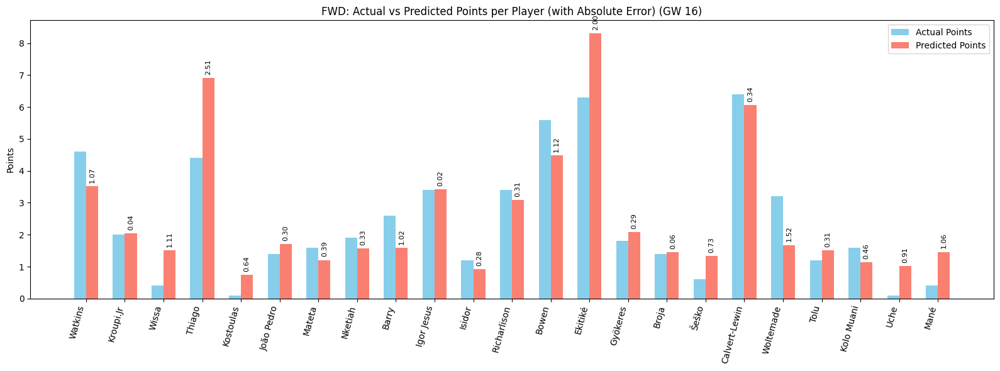

In [16]:
plot_preds(preds_df_16, 'FWD', 16)

### GW 17


Data prepared. X shape: (4706, 195), M shape: (4706, 8), Y shape: (4706, 2)

Starting Training...
Epoch 1/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - loss: 0.7538 - mae: 0.1664 - mse: 0.0432 - val_loss: 0.7082 - val_mae: 0.1613 - val_mse: 0.0386 - learning_rate: 1.0000e-04
Epoch 2/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6792 - mae: 0.1199 - mse: 0.0232 - val_loss: 0.6360 - val_mae: 0.1155 - val_mse: 0.0206 - learning_rate: 1.0000e-04
Epoch 3/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6178 - mae: 0.0968 - mse: 0.0156 - val_loss: 0.5768 - val_mae: 0.0929 - val_mse: 0.0135 - learning_rate: 1.0000e-04
Epoch 4/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5634 - mae: 0.0878 - mse: 0.0126 - val_loss: 0.5244 - val_mae: 0.0819 - val_mse: 0.0105 - learning_rate: 1.0000e-04
Epoch 5/100
69/69 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5131 - mae: 0.0811 - mse: 0.0110 - val_loss: 0.4765 - val_mae: 0.0755 - val_mse: 0.0089 - learning_rate: 1.0000e-04
Epoch 6/100
69/6

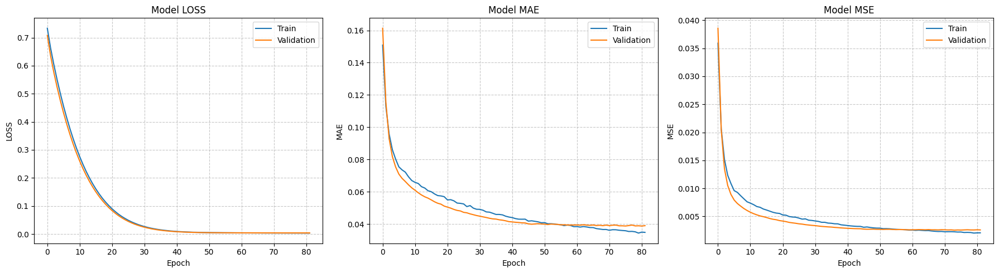


--- Final Test Set Evaluation (GW 22) ---
R²: 0.81995647093021240
MAE: 0.04057181626558304
MSE: 0.00284925545565784
Loss: 0.00416586501523852

--- Results for Gameweek 17 ---


,fpl_name,fpl_id,team,position,Actual_xP,Predicted_xP
3731,Foden,414.0,Man City,MID,12.1,8.967909
2934,Wilson,329.0,Fulham,MID,8.8,8.574839
3917,Haaland,430.0,Man City,FWD,9.9,8.475149
449,Rogers,47.0,Aston Villa,MID,8.2,8.228322
5803,Ekitiké,661.0,Liverpool,FWD,7.9,7.469114
...,...,...,...,...,...,...
498,J.Ramsey,52.0,Newcastle,MID,0.8,0.958699
5449,G.Rodriguez,618.0,West Ham,MID,0.3,0.888397
1614,Walker,187.0,Burnley,DEF,1.4,0.868181
1820,Tchaouna,210.0,Burnley,MID,1.0,0.830707


In [41]:
history_17, evaluation_metrics_17, preds_df_17 = apnn_trainer(active_data_, cols, 17)
# Plot History
plot_training_history(history_17)

# EVALUATE TEST SET PERFORMANCE
print(f"\n--- Final Test Set Evaluation (GW {gw}) ---")
print(f"R²: {evaluation_metrics_17['test_R2']:.17f}")
print(f"MAE: {evaluation_metrics_17['test_mae']:.17f}")
print(f"MSE: {evaluation_metrics_17['test_mse']:.17f}")
print(f"Loss: {evaluation_metrics_17['test_loss']:.17f}")


print("\n--- Results for Gameweek 17 ---")
preds_df_17.sort_values(by='Predicted_xP', ascending=False)#.#head(10).round(2).to_string(index=False))



#### Plots


###### GK


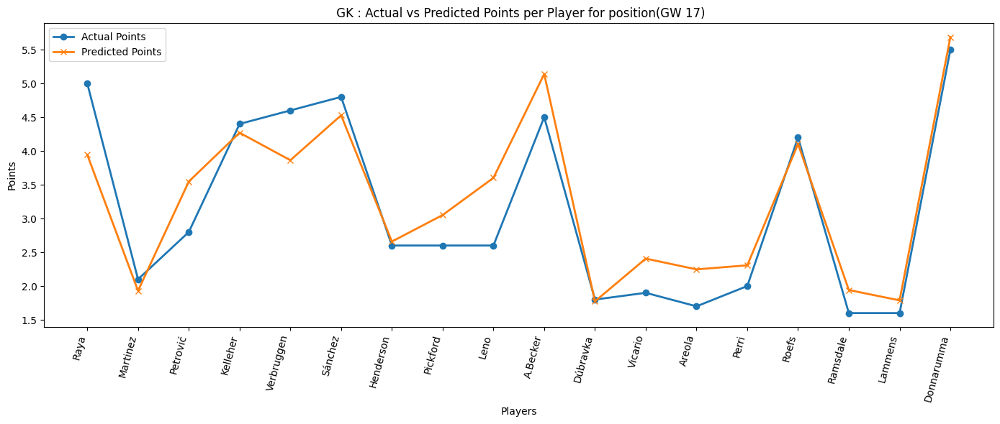

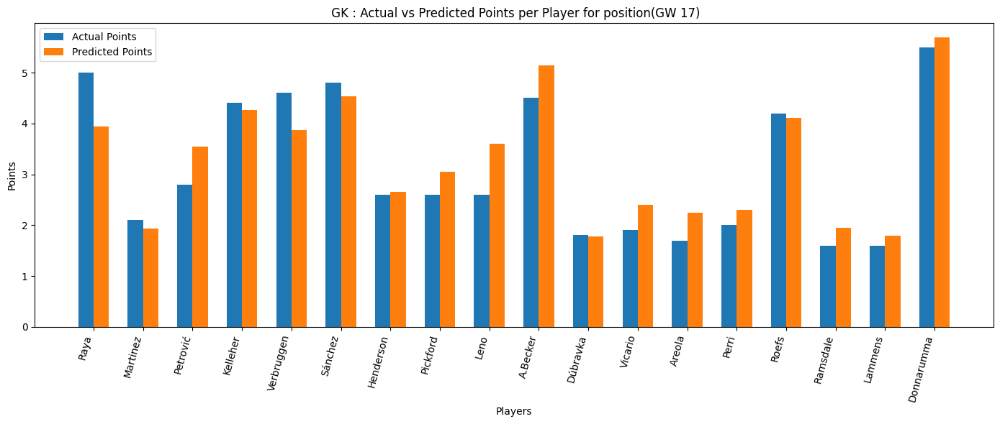

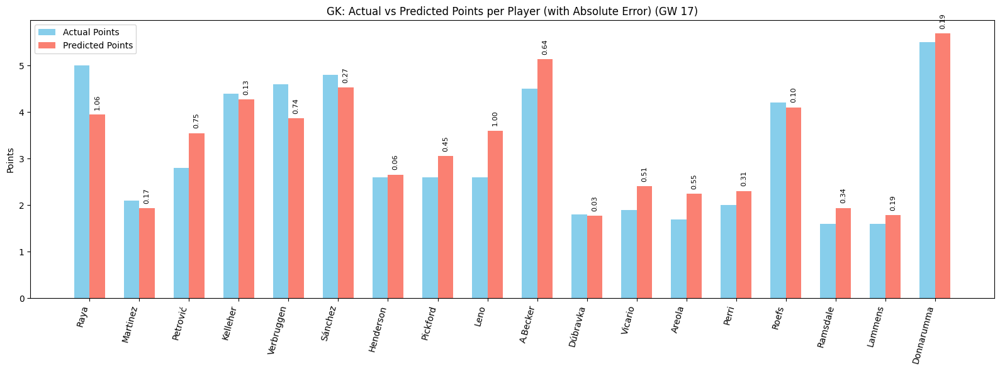

In [48]:
plot_preds(preds_df_17, 'GK', 17)


###### DEF


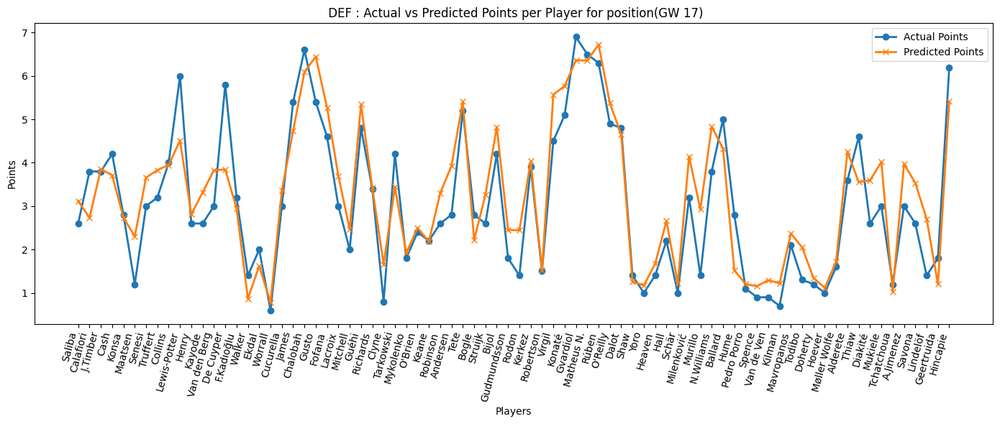

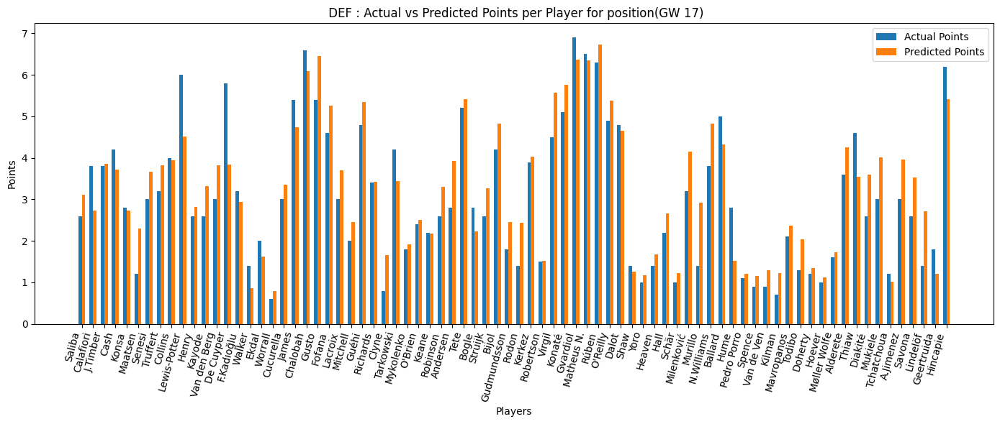

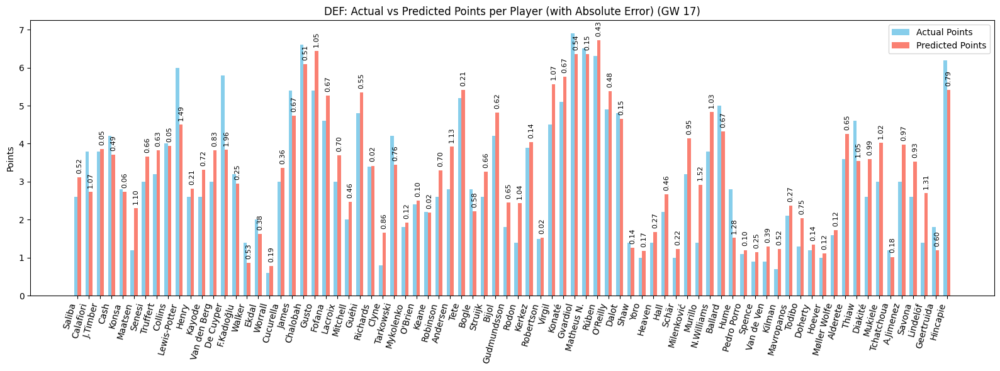

In [49]:
plot_preds(preds_df_17, 'DEF', 17)

###### MID


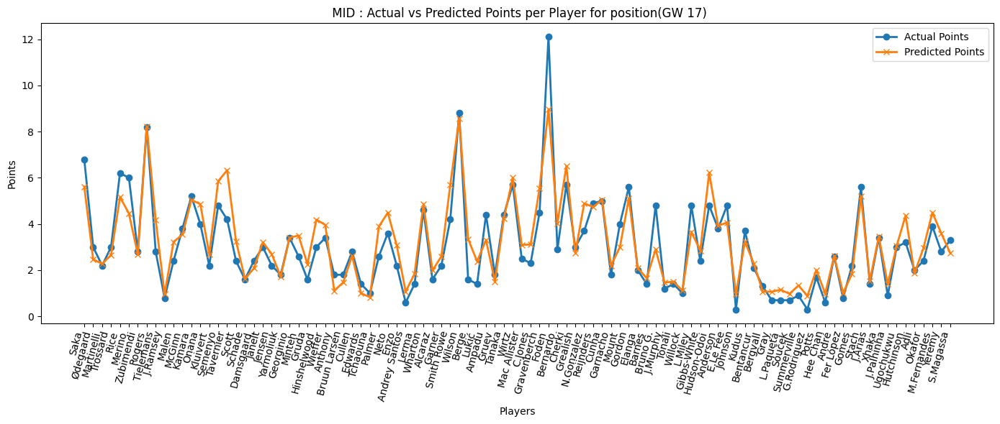

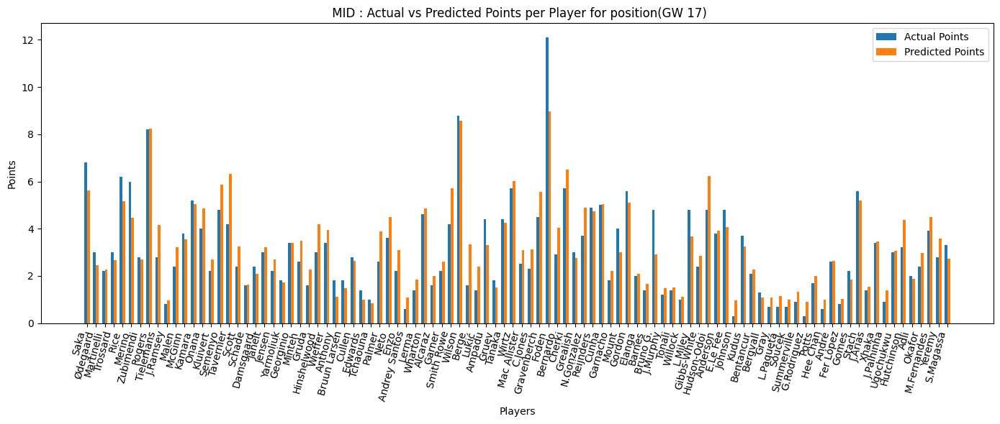

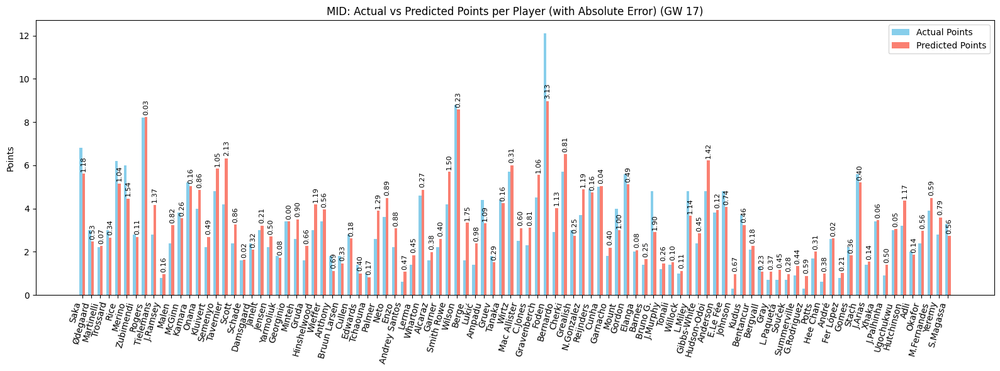

In [50]:
plot_preds(preds_df_17, 'MID', 17)

###### FWD


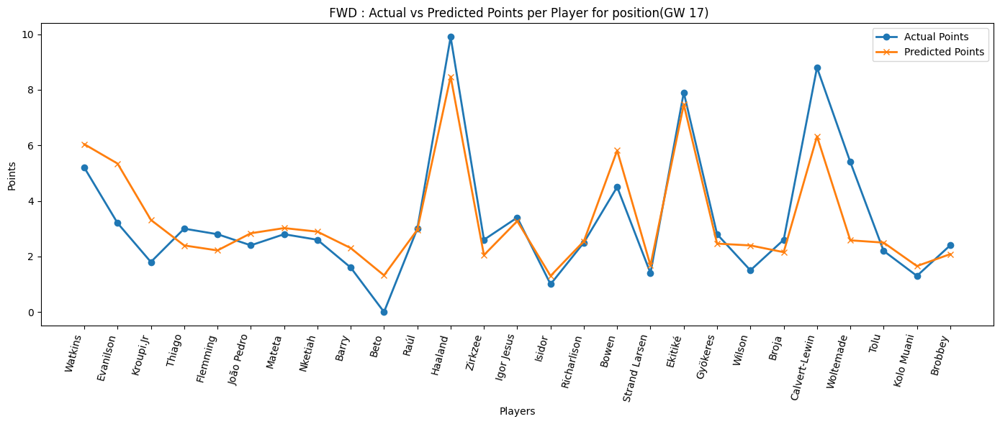

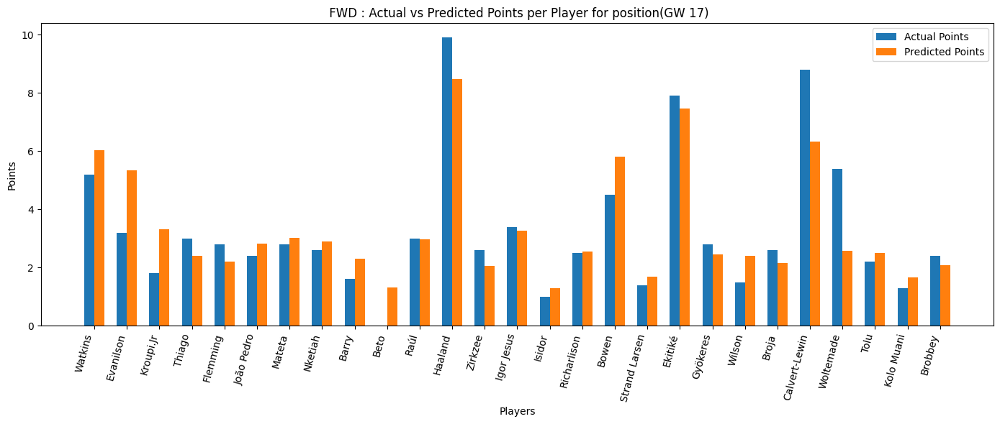

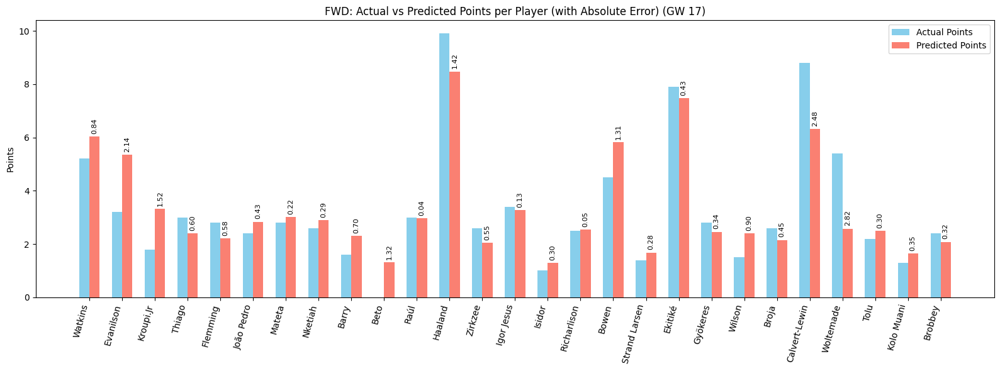

In [51]:
plot_preds(preds_df_17, 'FWD', 17)

### GW 18


Data prepared. X shape: (4706, 195), M shape: (4706, 8), Y shape: (4706, 2)

Starting Training...
Epoch 1/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 0.8530 - mae: 0.2994 - mse: 0.1230 - val_loss: 0.8006 - val_mae: 0.2808 - val_mse: 0.1014 - learning_rate: 1.0000e-04
Epoch 2/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.7456 - mae: 0.1927 - mse: 0.0569 - val_loss: 0.7046 - val_mae: 0.1812 - val_mse: 0.0480 - learning_rate: 1.0000e-04
Epoch 3/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6767 - mae: 0.1366 - mse: 0.0310 - val_loss: 0.6369 - val_mae: 0.1236 - val_mse: 0.0242 - learning_rate: 1.0000e-04
Epoch 4/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.6235 - mae: 0.1142 - mse: 0.0217 - val_loss: 0.5834 - val_mae: 0.0943 - val_mse: 0.0142 - learning_rate: 1.0000e-04
Epoch 5/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5754 - mae: 0.1008 - mse: 0.0168 - val_loss: 0.5373 - val_mae: 0.0811 - val_mse: 0.0104 - learning_rate: 1.0000e-04
Epoch 6/100
68/6

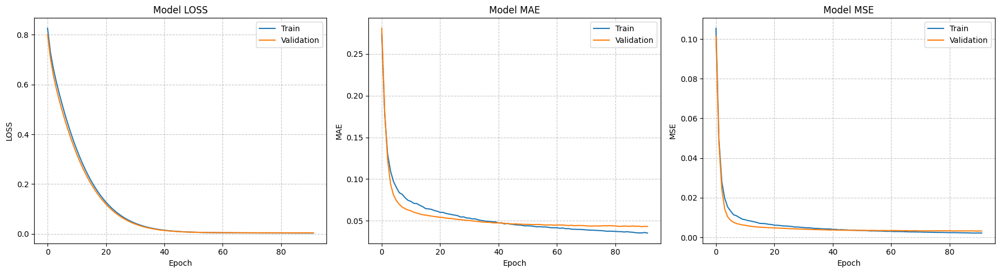


--- Final Test Set Evaluation (GW 18) ---
R²: 0.824611653839143699
MAE: 0.041091576218605042
MSE: 0.002965201623737812
Loss: 0.004297985229641199

--- Results for Gameweek 18 ---


,fpl_name,fpl_id,team,position,Actual_xP,Predicted_xP
5804,Ekitiké,661.0,Liverpool,FWD,7.5,8.789217
450,Rogers,47.0,Aston Villa,MID,7.0,8.696458
3918,Haaland,430.0,Man City,FWD,9.9,7.984731
2935,Wilson,329.0,Fulham,MID,5.8,7.334692
3732,Foden,414.0,Man City,MID,9.5,7.232871
...,...,...,...,...,...,...
4972,Isidor,560.0,Sunderland,FWD,0.8,0.932806
4409,Barnes,487.0,Newcastle,MID,1.2,0.916720
4727,Dominguez,519.0,Nott'm Forest,MID,0.3,0.903761
1310,Dunk,146.0,Brighton,DEF,0.2,0.855146


In [42]:
history_18, evaluation_metrics_18, preds_df_18 = apnn_trainer(active_data_, cols, 18)
# Plot History
plot_training_history(history_18)

# EVALUATE TEST SET PERFORMANCE
print(f"\n--- Final Test Set Evaluation (GW 18) ---")
print(f"R²: {evaluation_metrics_18['test_R2']:.18f}")
print(f"MAE: {evaluation_metrics_18['test_mae']:.18f}")
print(f"MSE: {evaluation_metrics_18['test_mse']:.18f}")
print(f"Loss: {evaluation_metrics_18['test_loss']:.18f}")


print("\n--- Results for Gameweek 18 ---")
preds_df_18.sort_values(by='Predicted_xP', ascending=False)#.#head(10).round(2).to_string(index=False))



#### Plots


###### GK


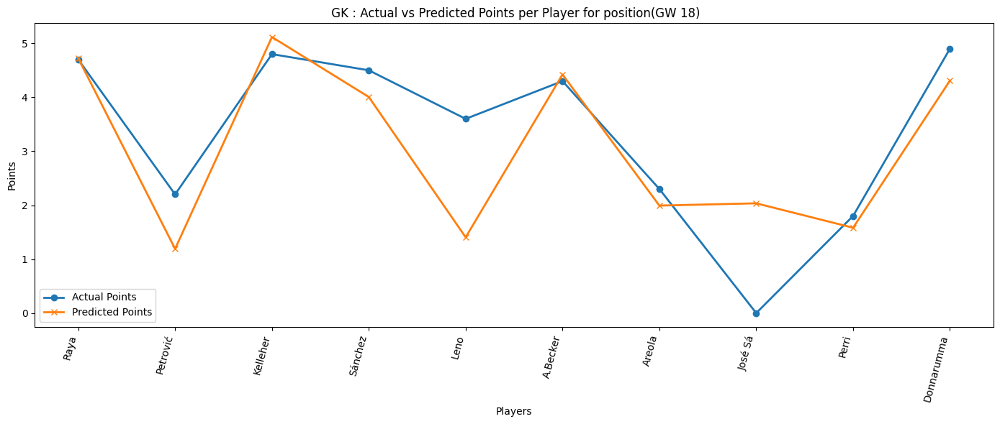

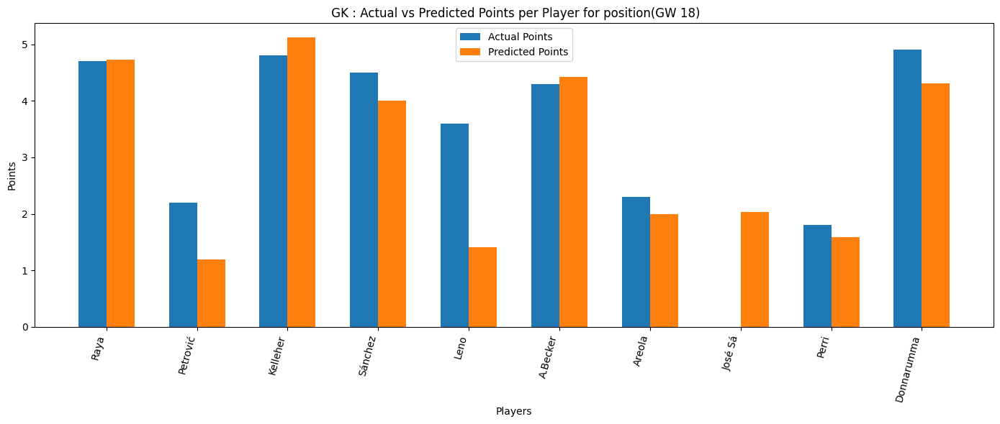

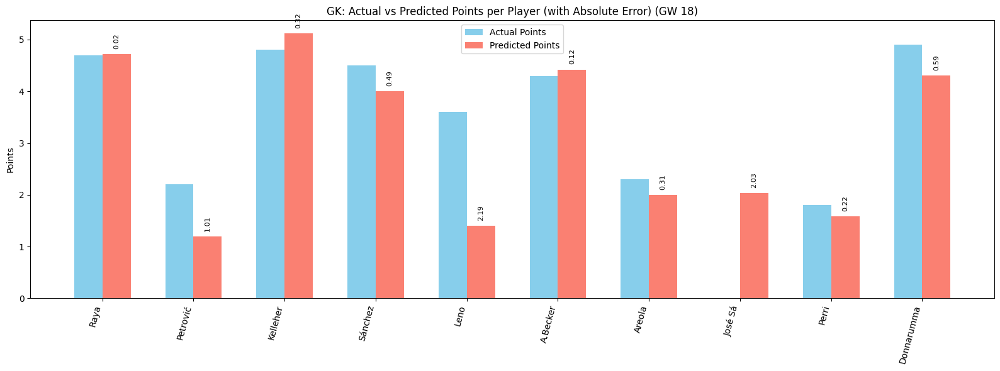

In [18]:
plot_preds(preds_df_18, 'GK', 18)


###### DEF


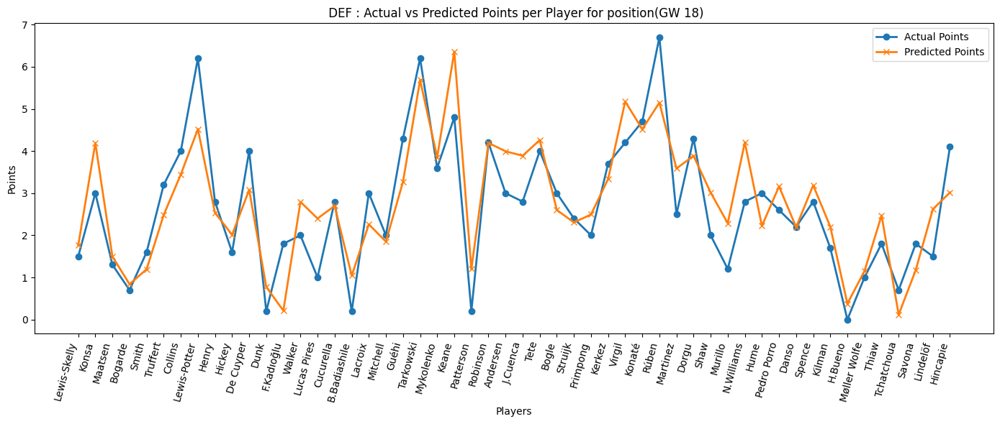

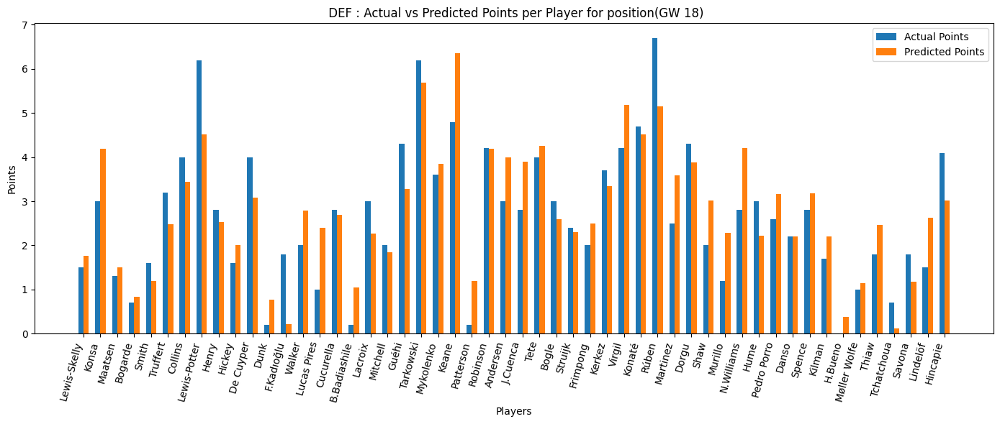

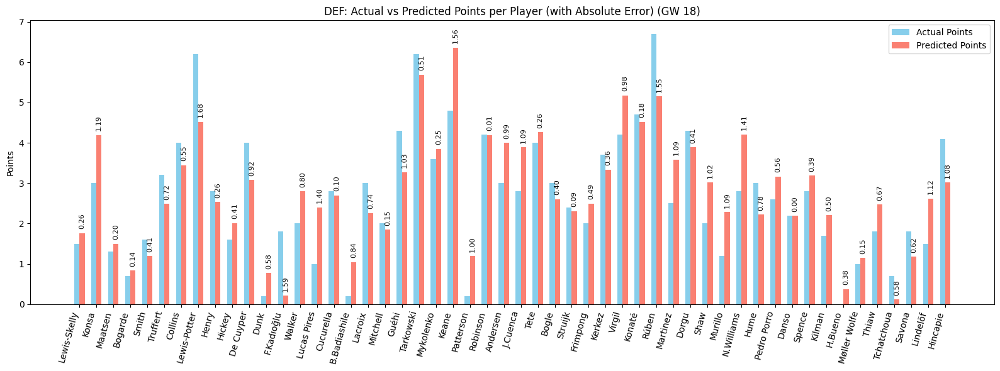

In [19]:
plot_preds(preds_df_18, 'DEF', 18)

###### MID


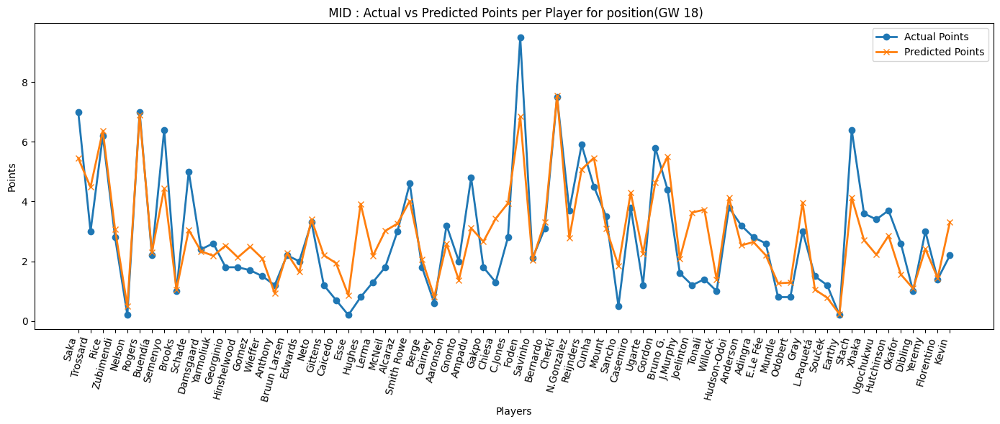

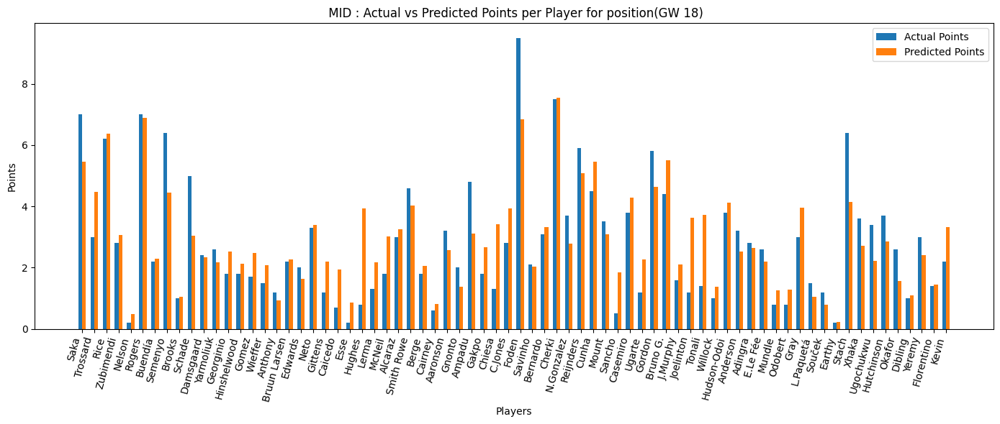

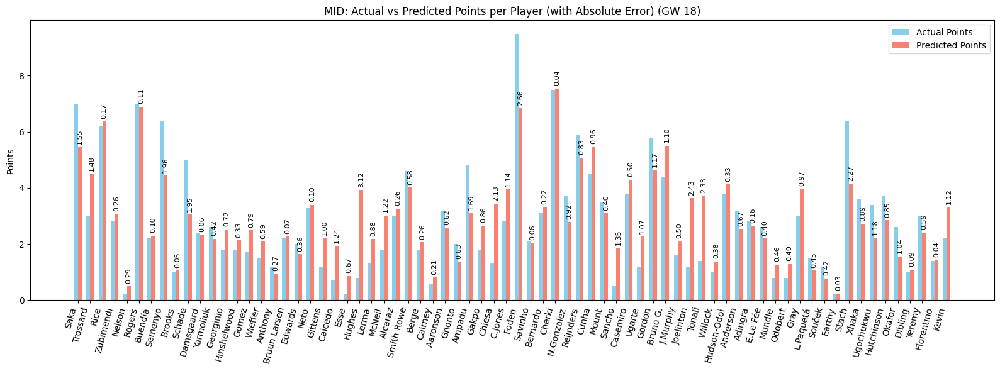

In [20]:
plot_preds(preds_df_18, 'MID', 18)

###### FWD


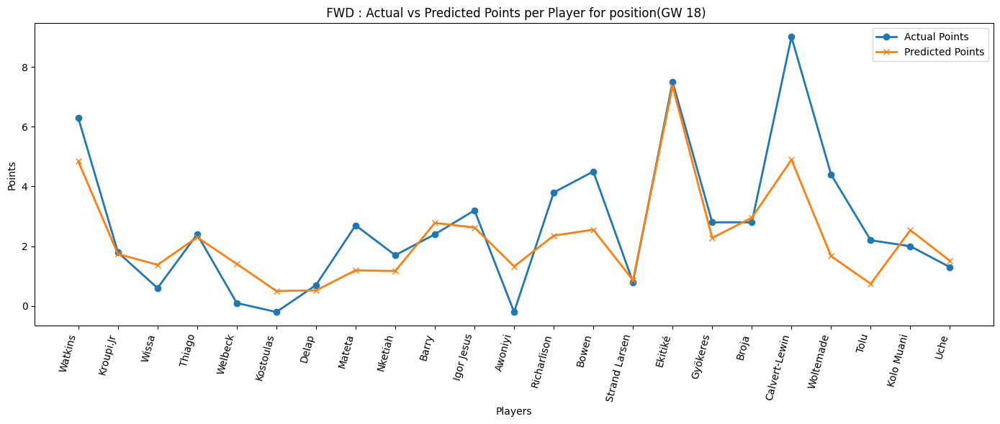

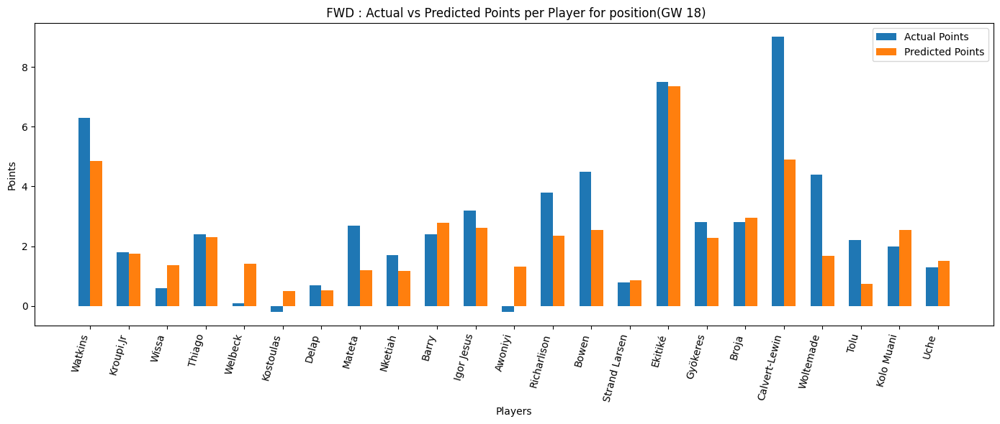

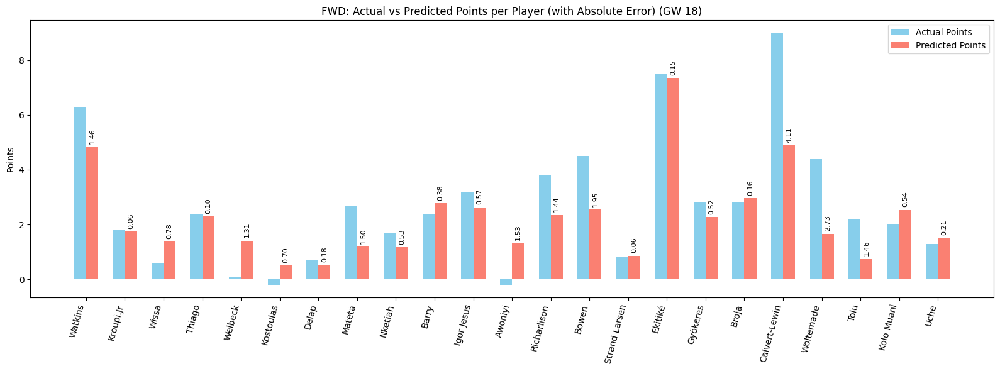

In [21]:
plot_preds(preds_df_18, 'FWD', 18)

### GW 19


Data prepared. X shape: (4706, 195), M shape: (4706, 8), Y shape: (4706, 2)

Starting Training...
Epoch 1/100


68/68 ━━━━━━━━━━━━━━━━━━━━ 6s 11ms/step - loss: 0.7785 - mae: 0.2227 - mse: 0.0707 - val_loss: 0.7046 - val_mae: 0.1449 - val_mse: 0.0298 - learning_rate: 1.0000e-04
Epoch 2/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6928 - mae: 0.1378 - mse: 0.0295 - val_loss: 0.6438 - val_mae: 0.1004 - val_mse: 0.0158 - learning_rate: 1.0000e-04
Epoch 3/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6362 - mae: 0.1104 - mse: 0.0199 - val_loss: 0.5927 - val_mae: 0.0836 - val_mse: 0.0114 - learning_rate: 1.0000e-04
Epoch 4/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5863 - mae: 0.0994 - mse: 0.0164 - val_loss: 0.5459 - val_mae: 0.0775 - val_mse: 0.0099 - learning_rate: 1.0000e-04
Epoch 5/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5397 - mae: 0.0936 - mse: 0.0146 - val_loss: 0.5019 - val_mae: 0.0735 - val_mse: 0.0090 - learning_rate: 1.0000e-04
Epoch 6/100
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.4953 - mae: 0.0865 - mse: 0.0127 - val_loss: 0.4605 - val_mae: 0.

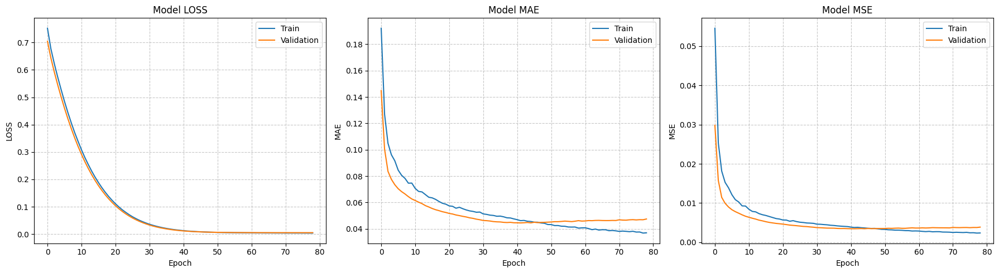


--- Final Test Set Evaluation (GW 22) ---
R²: 0.8037095223127209698
MAE: 0.0437441281974315643
MSE: 0.0031116867903620005
Loss: 0.0047492929734289646

--- Results for Gameweek 19 ---


,fpl_name,fpl_id,team,position,Actual_xP,Predicted_xP
3919,Haaland,430.0,Man City,FWD,7.5,8.124305
3788,Cherki,417.0,Man City,MID,8.5,7.918499
5805,Ekitiké,661.0,Liverpool,FWD,8.9,7.812620
3609,Gvardiol,403.0,Man City,DEF,7.5,7.739579
6161,Calvert-Lewin,691.0,Leeds,FWD,6.9,7.431390
...,...,...,...,...,...,...
5647,Hee Chan,642.0,Wolves,MID,1.2,0.732318
6078,Møller Wolfe,682.0,Wolves,DEF,1.4,0.723386
6275,Douglas Luiz,699.0,Nott'm Forest,MID,0.6,0.699180
5691,Fer López,645.0,Wolves,MID,1.0,0.682593


In [43]:
history_19, evaluation_metrics_19, preds_df_19 = apnn_trainer(active_data_, cols, 19)
# Plot History
plot_training_history(history_19)

# EVALUATE TEST SET PERFORMANCE
print(f"\n--- Final Test Set Evaluation (GW {gw}) ---")
print(f"R²: {evaluation_metrics_19['test_R2']:.19f}")
print(f"MAE: {evaluation_metrics_19['test_mae']:.19f}")
print(f"MSE: {evaluation_metrics_19['test_mse']:.19f}")
print(f"Loss: {evaluation_metrics_19['test_loss']:.19f}")


print("\n--- Results for Gameweek 19 ---")
preds_df_19.sort_values(by='Predicted_xP', ascending=False)#.#head(10).round(2).to_string(index=False))



#### Plots


###### GK


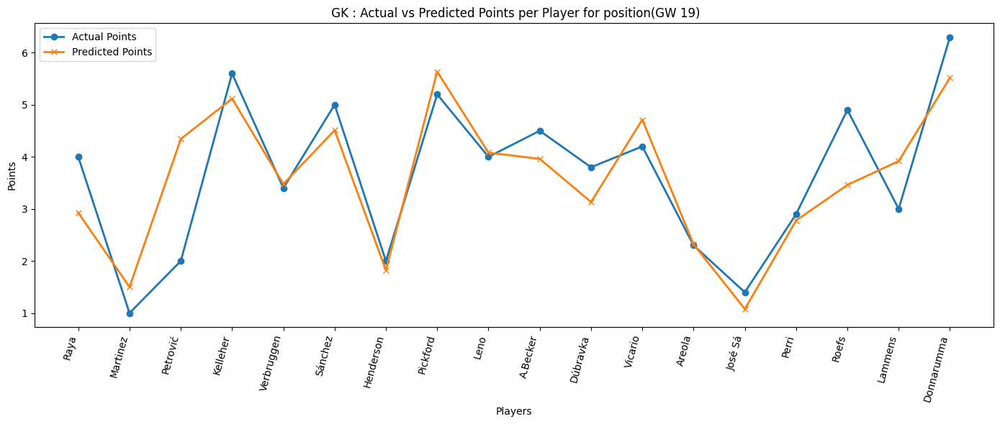

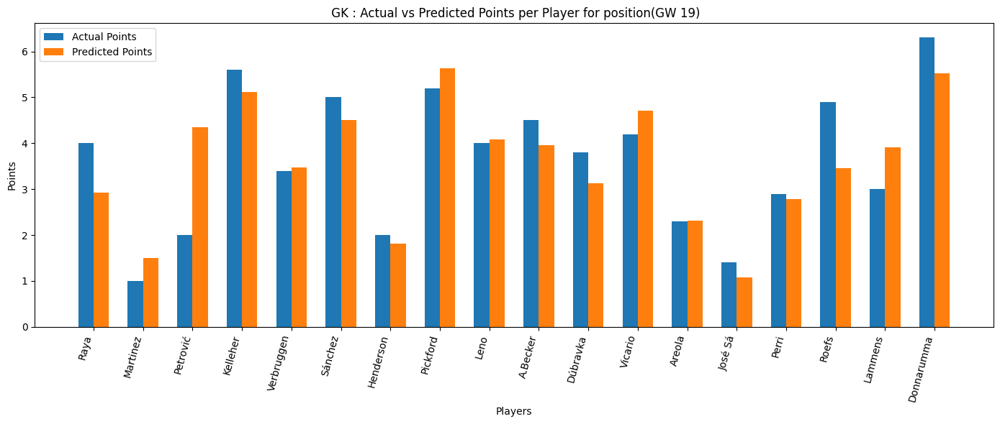

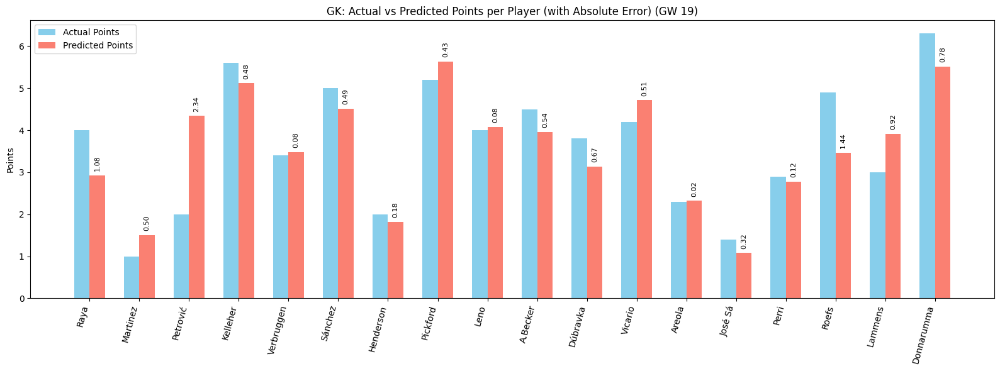

In [52]:
plot_preds(preds_df_19, 'GK', 19)


###### DEF


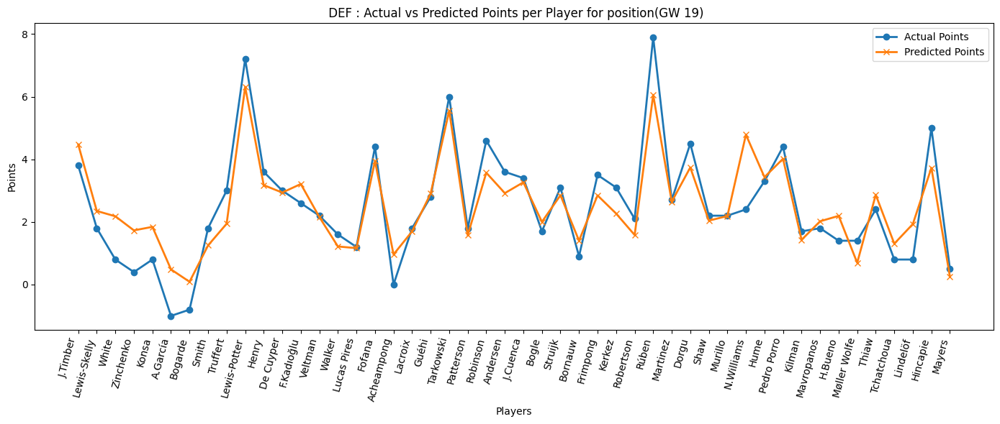

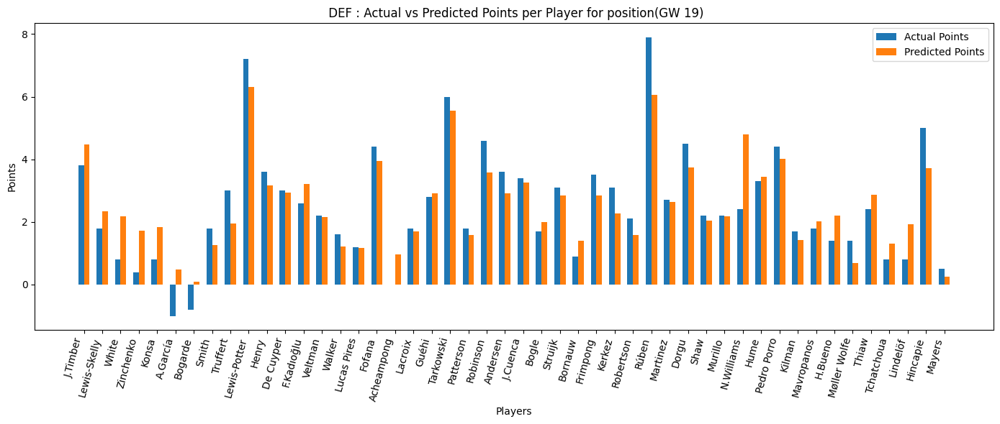

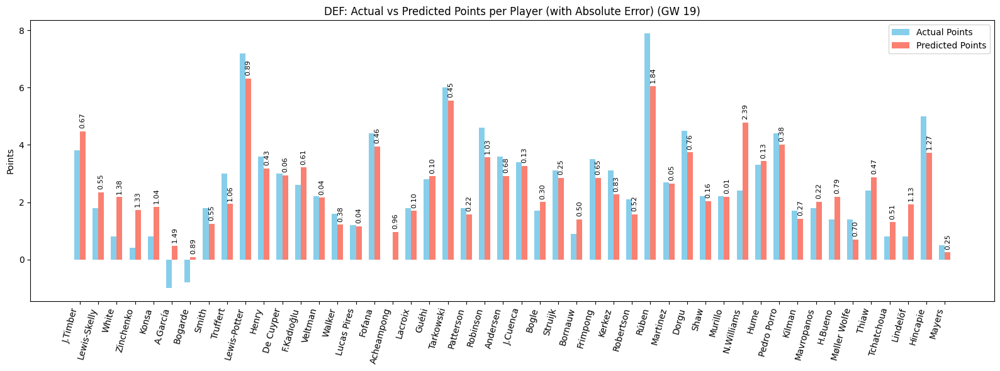

In [24]:
plot_preds(preds_df_19, 'DEF', 19)

###### MID


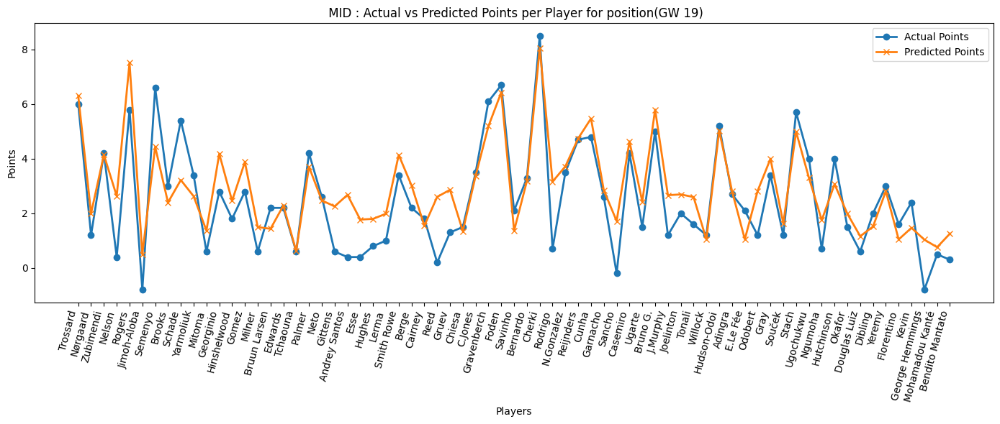

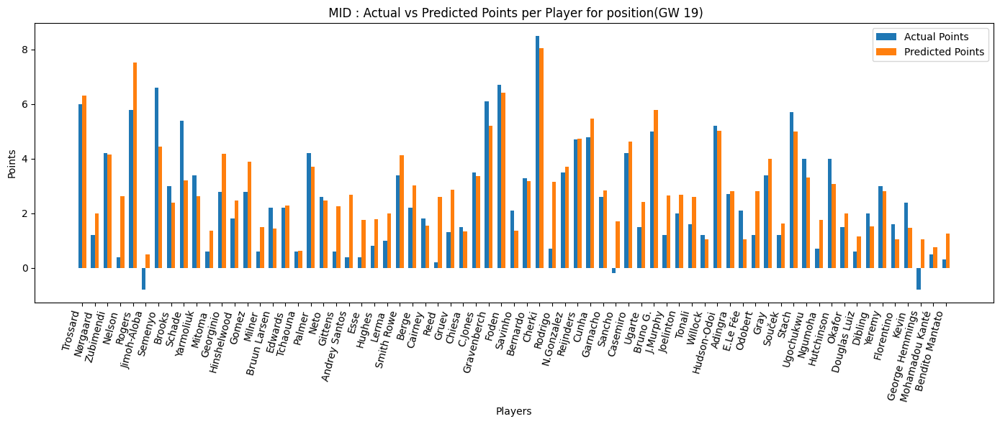

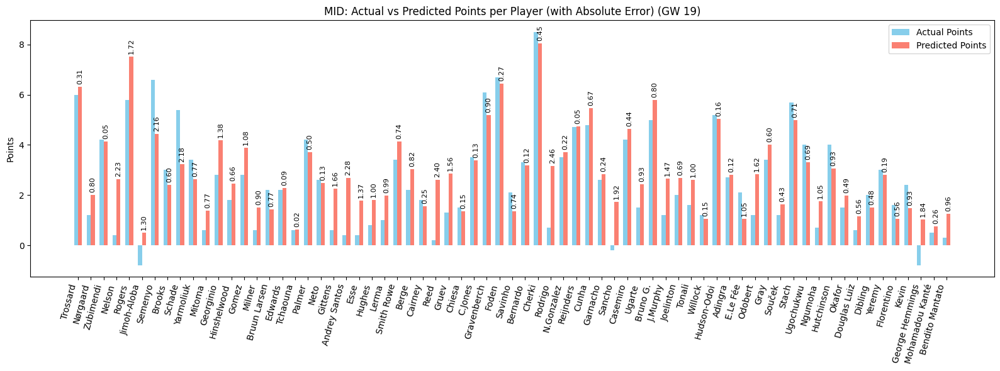

In [25]:
plot_preds(preds_df_19, 'MID', 19)

###### FWD


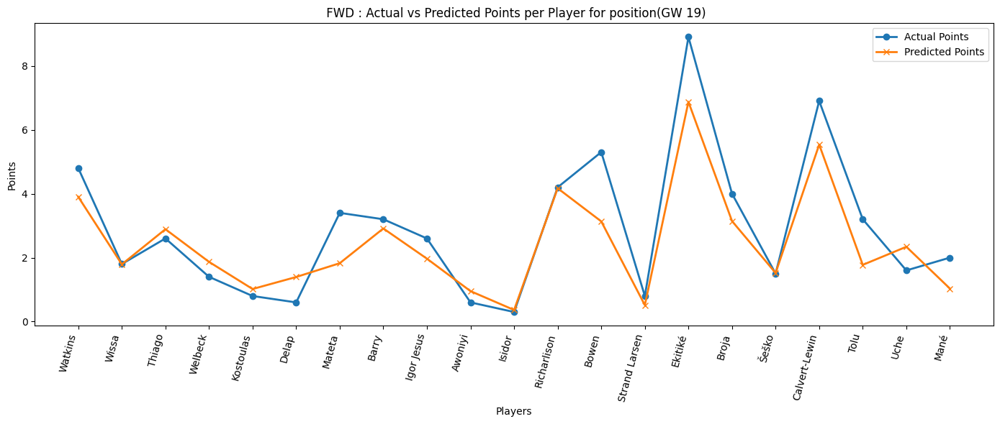

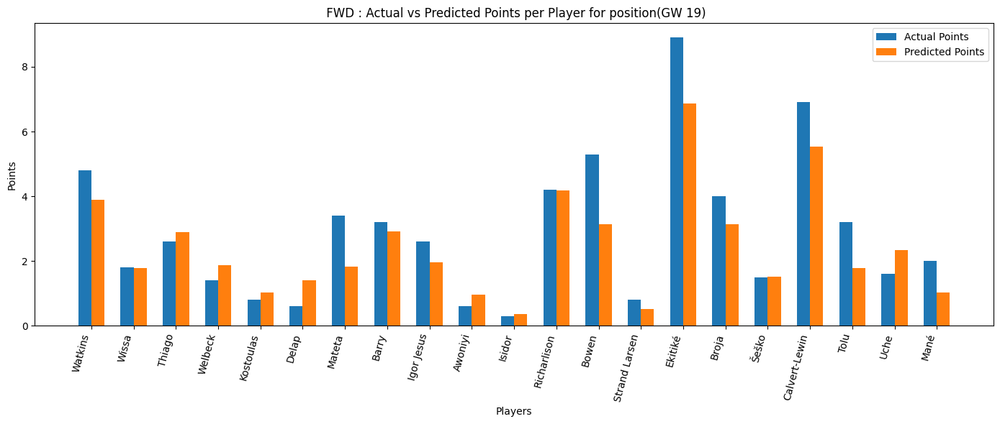

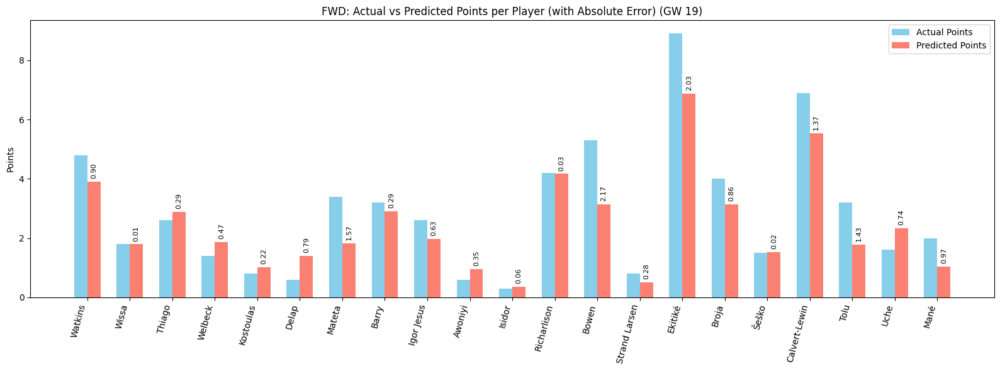

In [26]:
plot_preds(preds_df_19, 'FWD', 19)

### GW 20


Data prepared. X shape: (4706, 195), M shape: (4706, 8), Y shape: (4706, 2)

Starting Training...
Epoch 1/100


67/67 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.8307 - mae: 0.3010 - mse: 0.1145 - val_loss: 0.7575 - val_mae: 0.2394 - val_mse: 0.0735 - learning_rate: 1.0000e-04
Epoch 2/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.7272 - mae: 0.1953 - mse: 0.0541 - val_loss: 0.6768 - val_mae: 0.1614 - val_mse: 0.0368 - learning_rate: 1.0000e-04
Epoch 3/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.6574 - mae: 0.1375 - mse: 0.0286 - val_loss: 0.6156 - val_mae: 0.1155 - val_mse: 0.0203 - learning_rate: 1.0000e-04
Epoch 4/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.6032 - mae: 0.1111 - mse: 0.0191 - val_loss: 0.5648 - val_mae: 0.0923 - val_mse: 0.0137 - learning_rate: 1.0000e-04
Epoch 5/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.5556 - mae: 0.0978 - mse: 0.0153 - val_loss: 0.5192 - val_mae: 0.0807 - val_mse: 0.0107 - learning_rate: 1.0000e-04
Epoch 6/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.5110 - mae: 0.0891 - mse: 0.0127 - val_loss: 0.4773 - val_mae: 0.

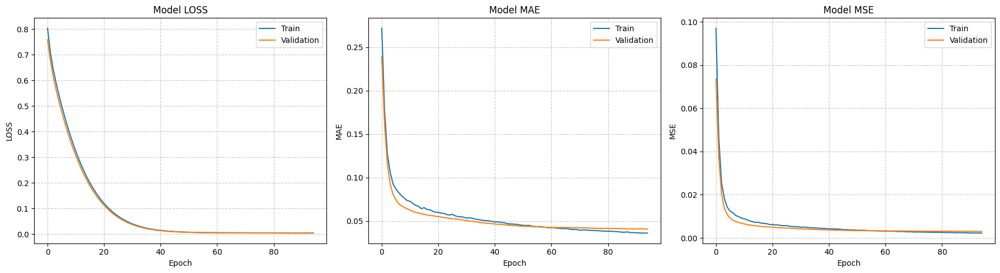


--- Final Test Set Evaluation (GW 22) ---
R²: 0.78901243970934353822
MAE: 0.04653649032115936279
MSE: 0.00339939934201538563
Loss: 0.00482482230290770531

--- Results for Gameweek 20 ---


,fpl_name,fpl_id,team,position,Actual_xP,Predicted_xP
3920,Haaland,430.0,Man City,FWD,7.5,8.149001
2662,Garner,303.0,Everton,MID,6.6,7.843357
135,Saka,16.0,Arsenal,MID,7.2,7.576088
3789,Cherki,417.0,Man City,MID,6.9,6.885103
3647,Matheus N.,407.0,Man City,DEF,7.5,6.664729
...,...,...,...,...,...,...
2814,Castagne,319.0,Fulham,DEF,0.2,0.762057
1971,B.Badiashile,229.0,Chelsea,DEF,0.1,0.741444
6220,Tchatchoua,695.0,Wolves,DEF,1.5,0.736185
2001,Acheampong,233.0,Chelsea,DEF,-0.1,0.611951


In [44]:
history_20, evaluation_metrics_20, preds_df_20 = apnn_trainer(active_data_, cols, 20)
# Plot History
plot_training_history(history_20)

# EVALUATE TEST SET PERFORMANCE
print(f"\n--- Final Test Set Evaluation (GW {gw}) ---")
print(f"R²: {evaluation_metrics_20['test_R2']:.20f}")
print(f"MAE: {evaluation_metrics_20['test_mae']:.20f}")
print(f"MSE: {evaluation_metrics_20['test_mse']:.20f}")
print(f"Loss: {evaluation_metrics_20['test_loss']:.20f}")


print("\n--- Results for Gameweek 20 ---")
preds_df_20.sort_values(by='Predicted_xP', ascending=False)#.#head(10).round(2).to_string(index=False))



#### Plots


###### GK


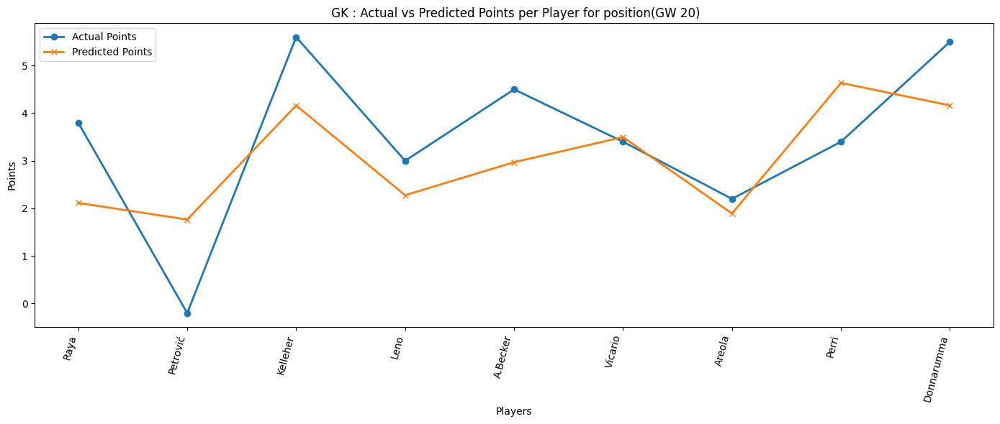

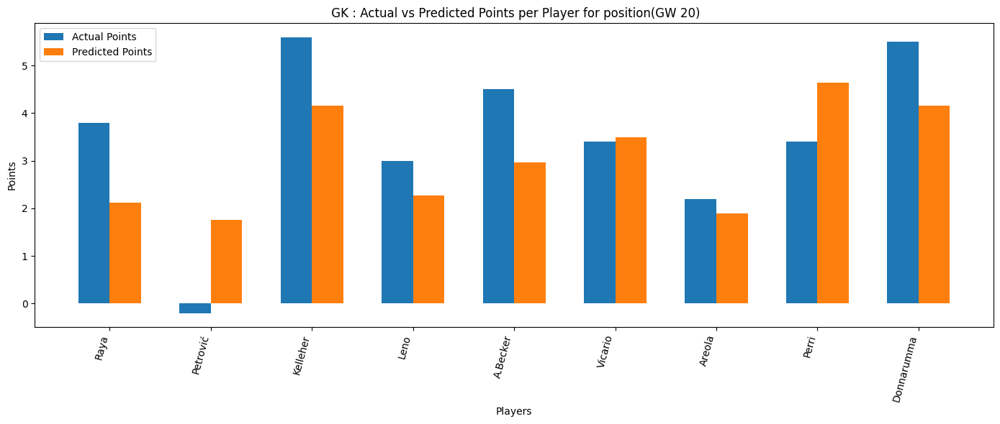

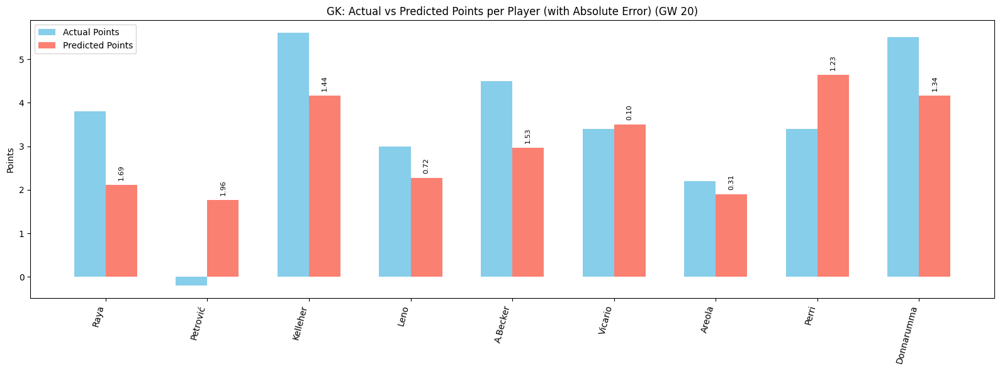

In [28]:
plot_preds(preds_df_20, 'GK', 20)


###### DEF


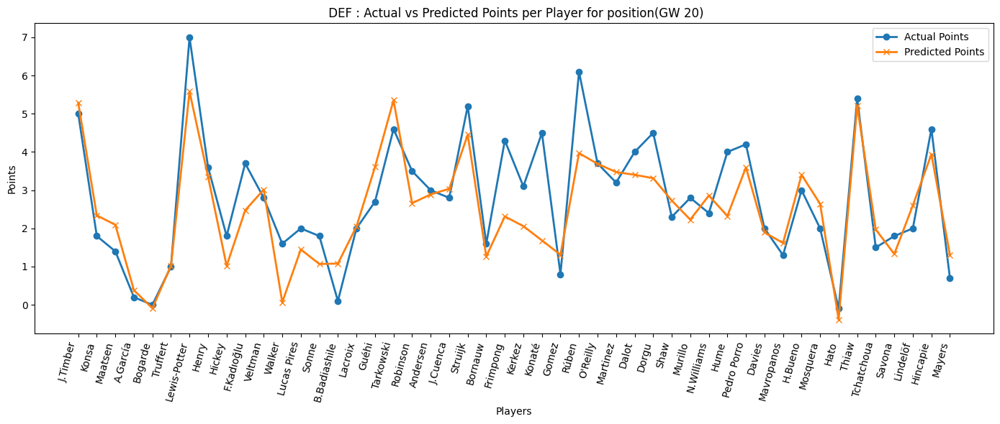

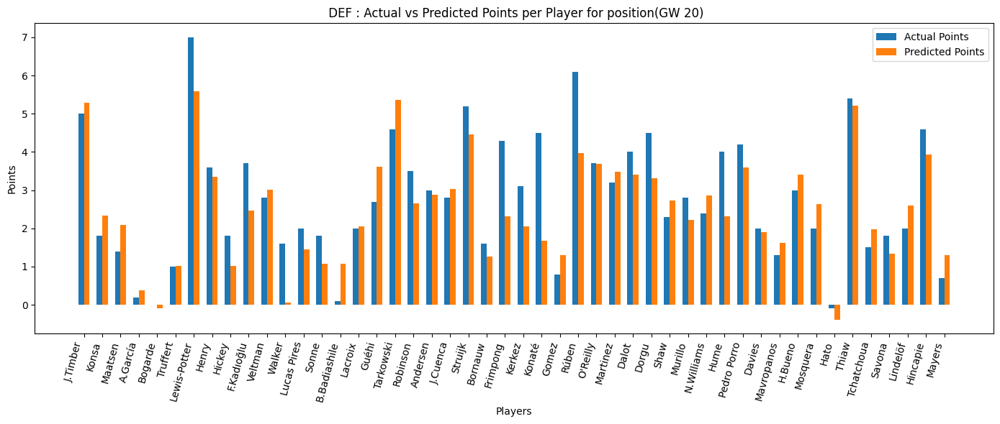

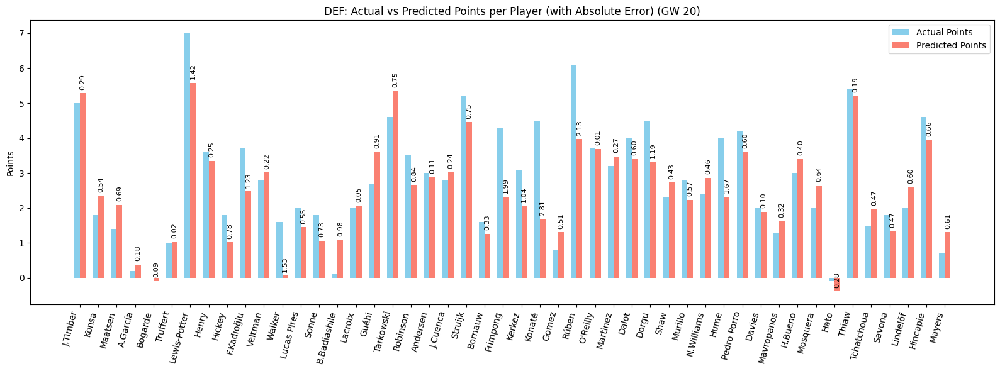

In [29]:
plot_preds(preds_df_20, 'DEF', 20)

###### MID


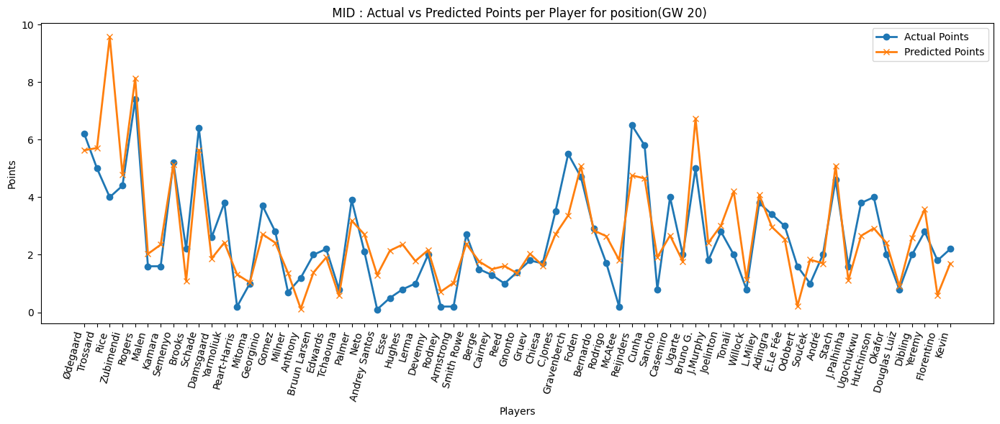

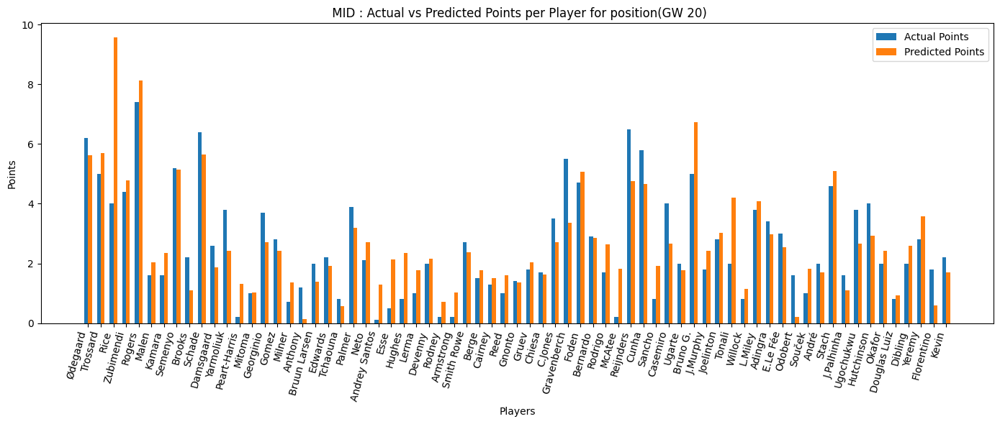

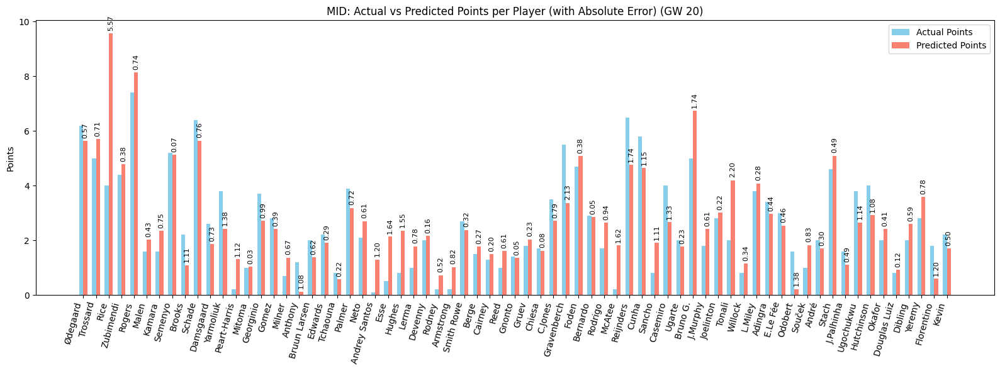

In [30]:
plot_preds(preds_df_20, 'MID', 20)

###### FWD


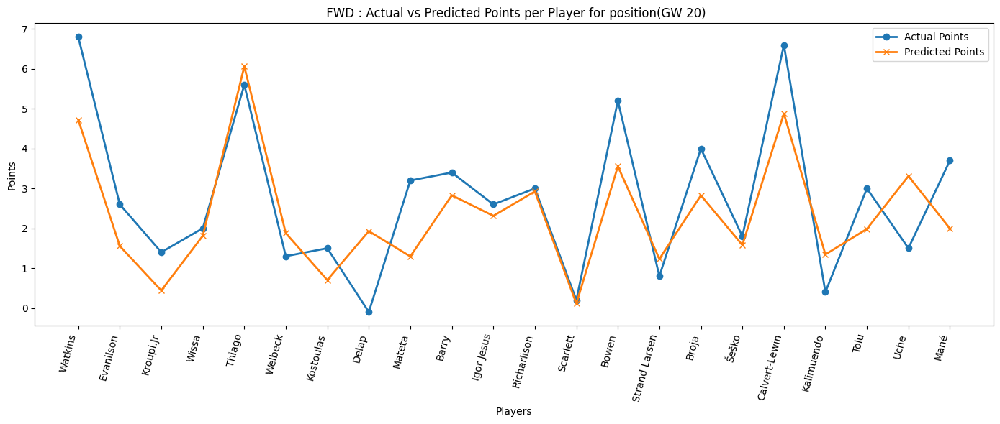

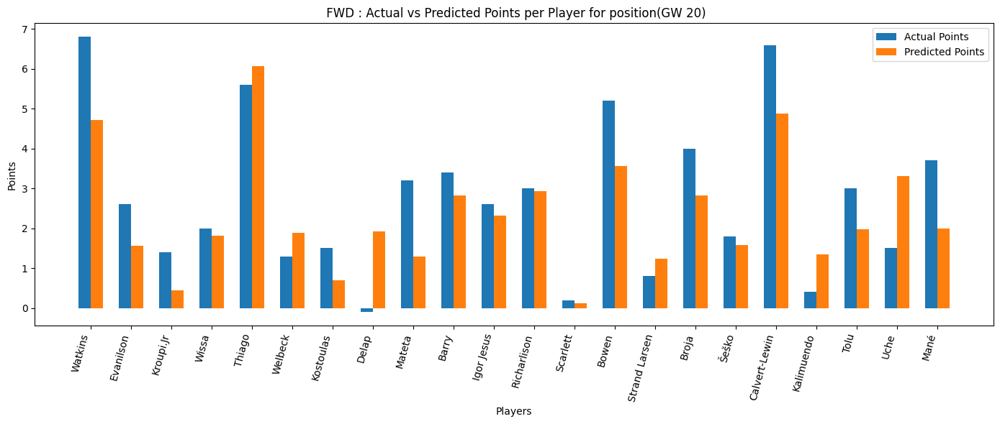

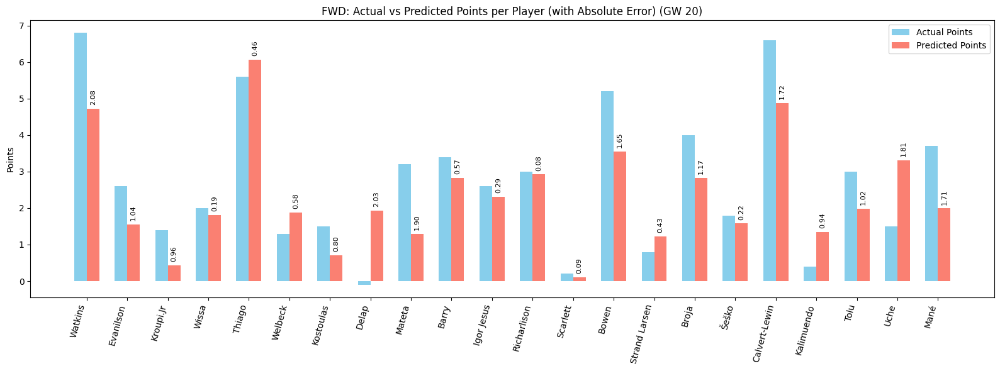

In [31]:
plot_preds(preds_df_20, 'FWD', 20)

### GW 21


Data prepared. X shape: (4706, 195), M shape: (4706, 8), Y shape: (4706, 2)

Starting Training...
Epoch 1/100


67/67 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 0.7817 - mae: 0.2170 - mse: 0.0744 - val_loss: 0.7326 - val_mae: 0.1796 - val_mse: 0.0587 - learning_rate: 1.0000e-04
Epoch 2/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.6988 - mae: 0.1474 - mse: 0.0361 - val_loss: 0.6584 - val_mae: 0.1290 - val_mse: 0.0294 - learning_rate: 1.0000e-04
Epoch 3/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.6408 - mae: 0.1166 - mse: 0.0231 - val_loss: 0.6019 - val_mae: 0.1033 - val_mse: 0.0177 - learning_rate: 1.0000e-04
Epoch 4/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.5904 - mae: 0.1023 - mse: 0.0172 - val_loss: 0.5540 - val_mae: 0.0905 - val_mse: 0.0134 - learning_rate: 1.0000e-04
Epoch 5/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5447 - mae: 0.0945 - mse: 0.0147 - val_loss: 0.5102 - val_mae: 0.0843 - val_mse: 0.0114 - learning_rate: 1.0000e-04
Epoch 6/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.5013 - mae: 0.0866 - mse: 0.0126 - val_loss: 0.4693 - val_mae: 0

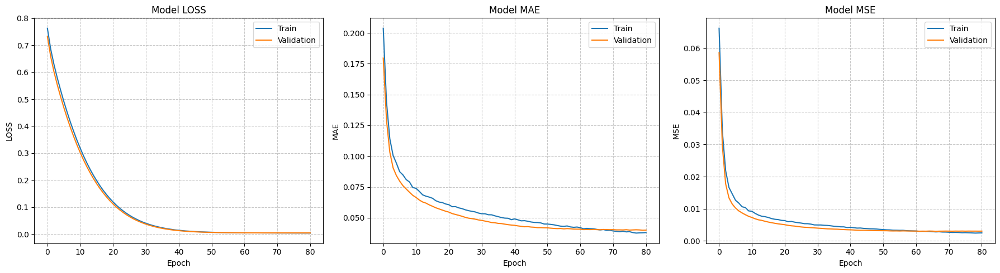


--- Final Test Set Evaluation (GW 21) ---
R²: 0.809640454785959806649
MAE: 0.039006985723972320557
MSE: 0.002709477208554744720
Loss: 0.004294399172067642212

--- Results for Gameweek 21 ---


,fpl_name,fpl_id,team,position,Actual_xP,Predicted_xP
221,Rice,21.0,Arsenal,MID,6.8,7.923240
946,Collins,106.0,Brentford,DEF,8.0,7.515838
36,Gabriel,5.0,Arsenal,DEF,5.7,7.513002
2663,Garner,303.0,Everton,MID,6.5,6.951552
4433,Bruno G.,488.0,Newcastle,MID,6.0,6.872351
...,...,...,...,...,...,...
2173,Delap,250.0,Chelsea,FWD,1.5,0.886422
430,Bogarde,44.0,Aston Villa,DEF,0.2,0.802918
1293,De Cuyper,145.0,Brighton,DEF,1.0,0.798784
1527,Milner,170.0,Brighton,MID,0.3,0.699204


In [45]:
history_21, evaluation_metrics_21, preds_df_21 = apnn_trainer(active_data_, cols, 21)
# Plot History
plot_training_history(history_21)

# EVALUATE TEST SET PERFORMANCE
print(f"\n--- Final Test Set Evaluation (GW 21) ---")
print(f"R²: {evaluation_metrics_21['test_R2']:.21f}")
print(f"MAE: {evaluation_metrics_21['test_mae']:.21f}")
print(f"MSE: {evaluation_metrics_21['test_mse']:.21f}")
print(f"Loss: {evaluation_metrics_21['test_loss']:.21f}")


print("\n--- Results for Gameweek 21 ---")
preds_df_21.sort_values(by='Predicted_xP', ascending=False)#.#head(10).round(2).to_string(index=False))



#### Plots


###### GK


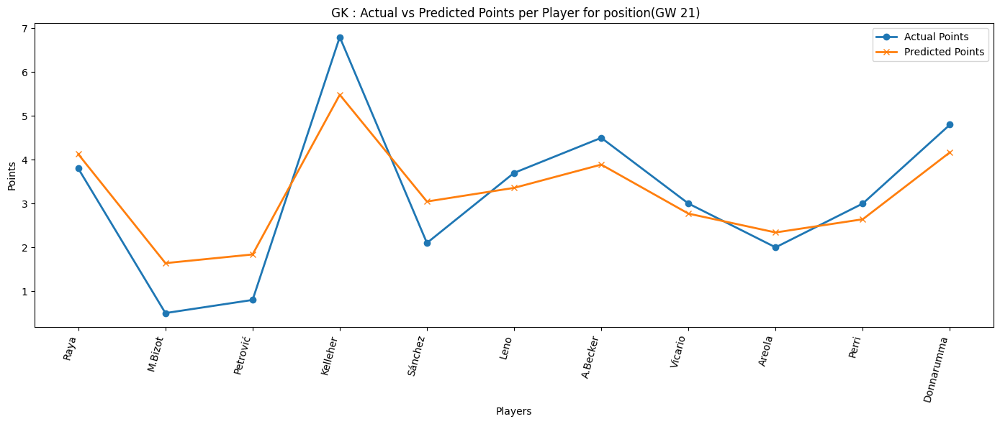

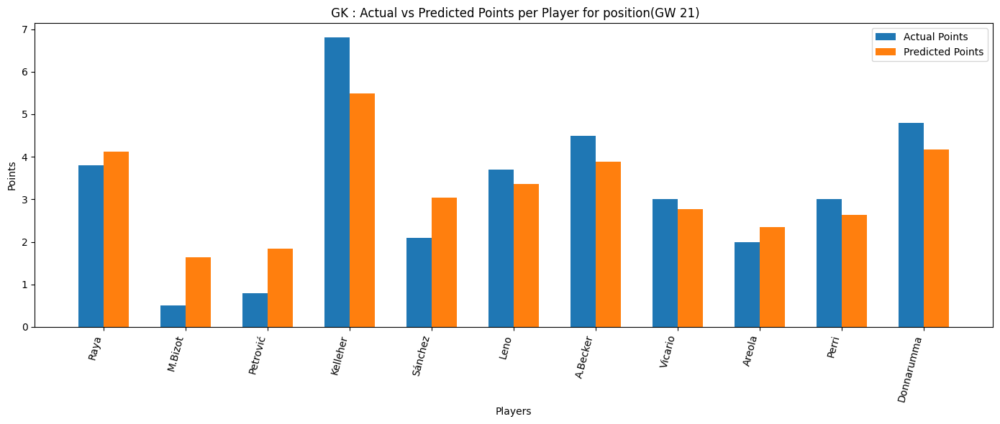

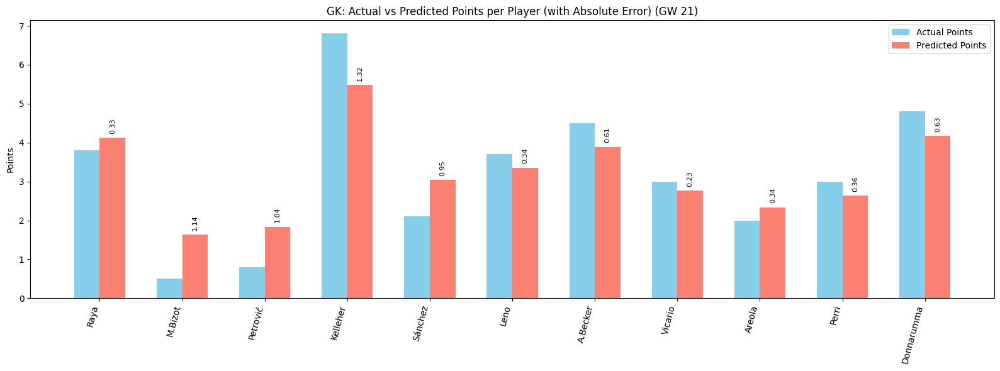

In [39]:
plot_preds(preds_df_21, 'GK', 21)


###### DEF


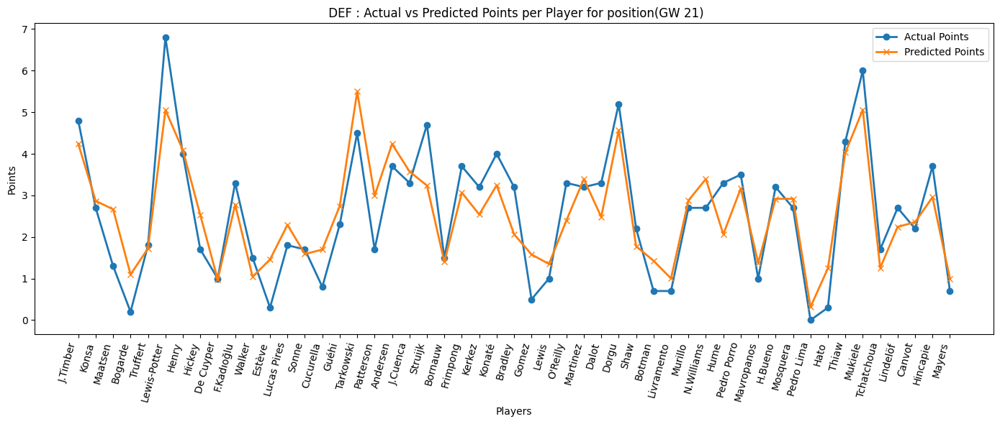

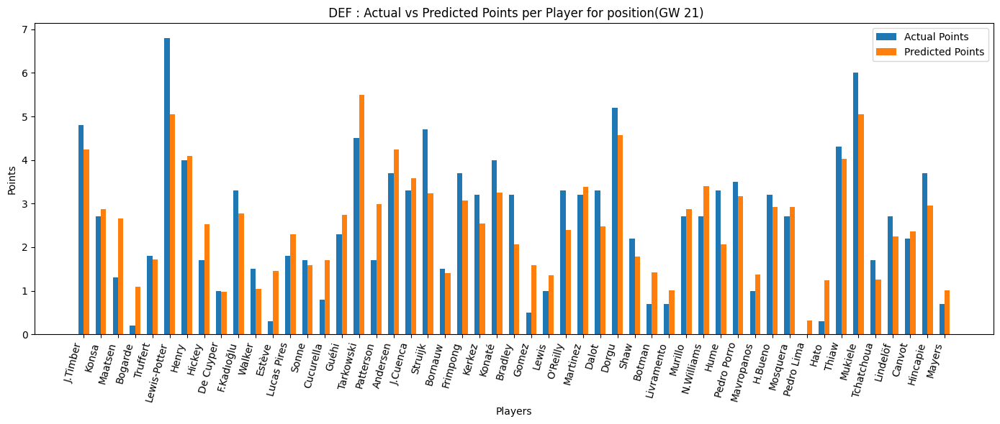

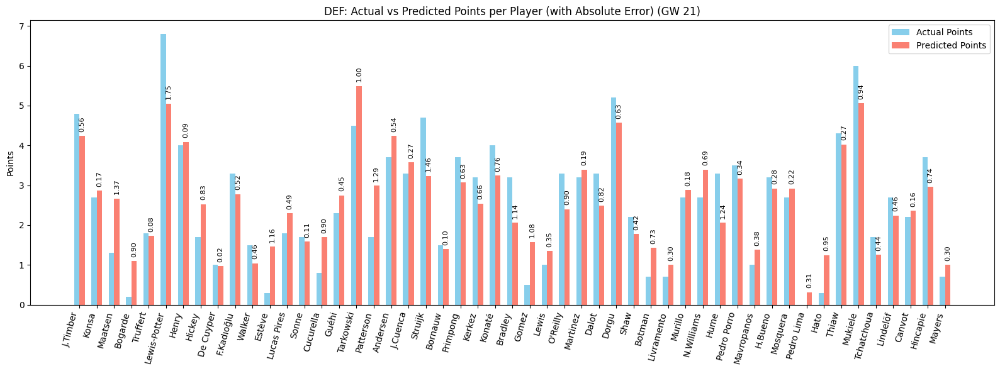

In [40]:
plot_preds(preds_df_21, 'DEF', 21)

###### MID


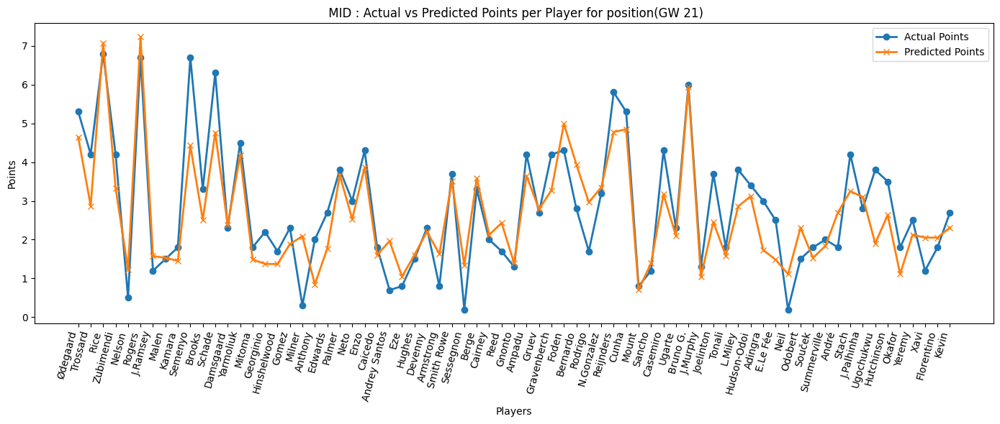

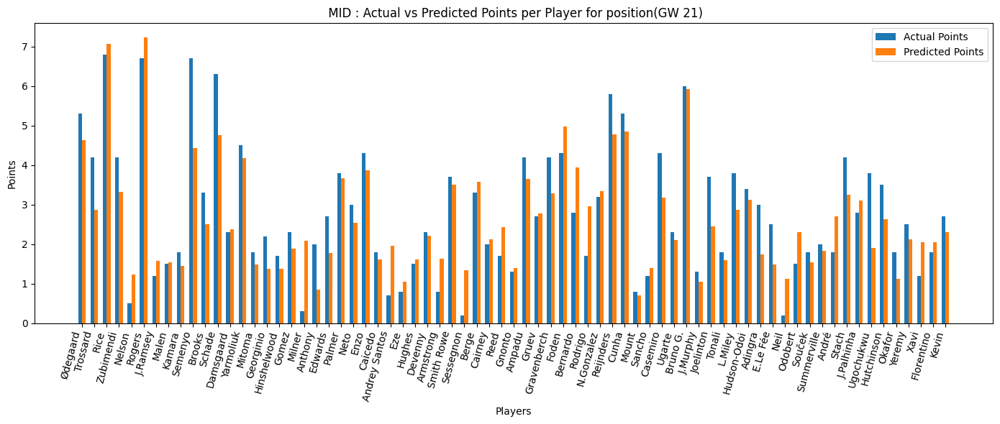

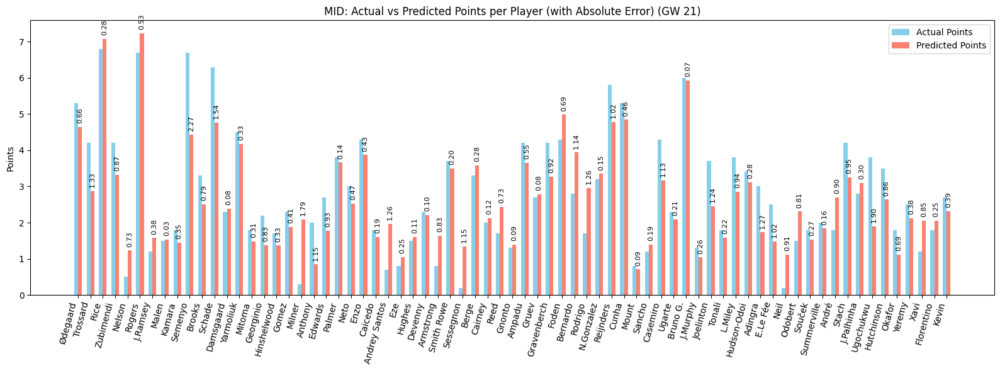

In [41]:
plot_preds(preds_df_21, 'MID', 21)

###### FWD


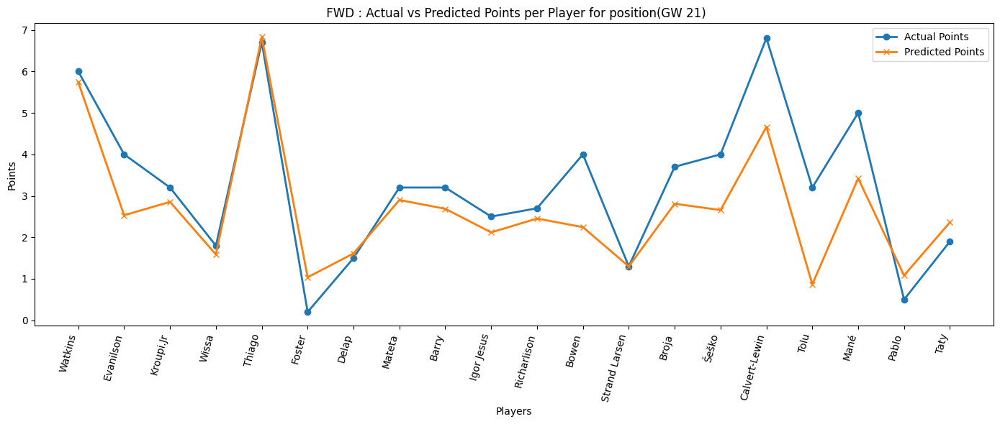

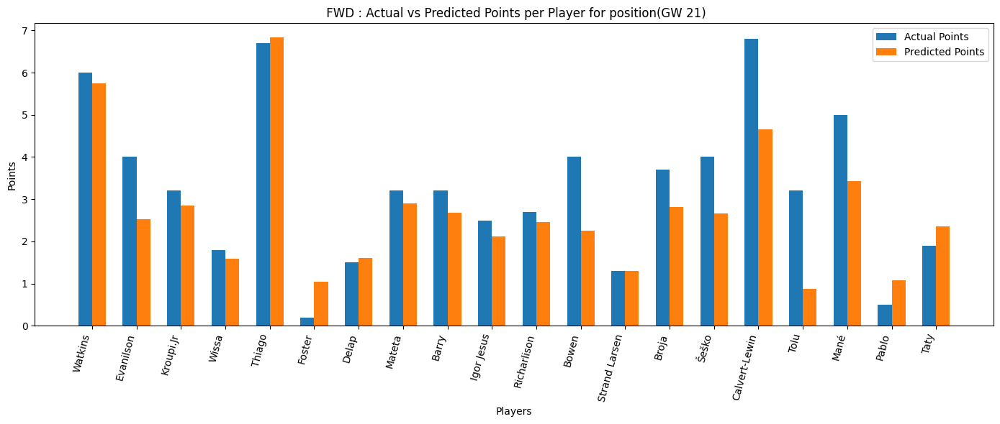

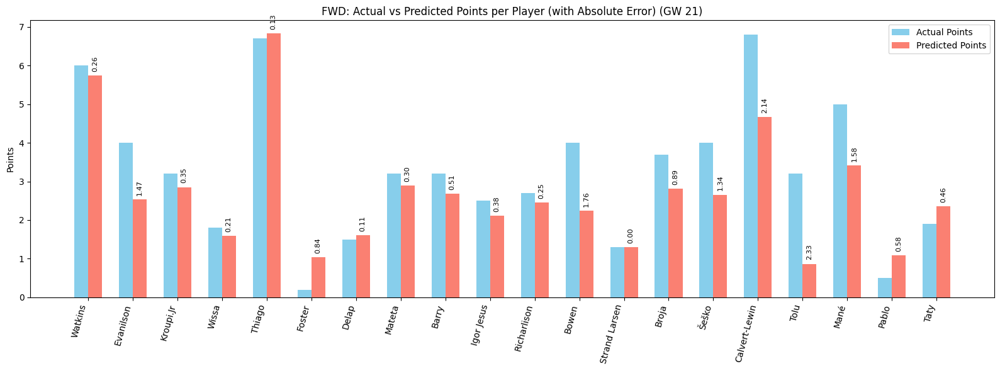

In [42]:
plot_preds(preds_df_21, 'FWD', 21)

## Results


In [60]:
evaluation_metrics_df =pd.DataFrame([evaluation_metrics_16, evaluation_metrics_17, evaluation_metrics_18, evaluation_metrics_19, evaluation_metrics_20, evaluation_metrics_21])
evaluation_metrics_df = evaluation_metrics_df.assign(round= [16, 17, 18, 19, 20, 21])
evaluation_metrics_df

,test_loss,test_mae,test_mse,test_R2,round
0,0.004411,0.042669,0.003113,0.792717,16
1,0.004166,0.040572,0.002849,0.819956,17
2,0.004298,0.041092,0.002965,0.824612,18
3,0.004749,0.043744,0.003112,0.803710,19
4,0.004825,0.046536,0.003399,0.789012,20
5,0.004294,0.039007,0.002709,0.809640,21


## Current


Data prepared. X shape: (4706, 195), M shape: (4706, 8), Y shape: (4706, 2)

Starting Training...
Epoch 1/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 0.8190 - mae: 0.2834 - mse: 0.1068 - val_loss: 0.7623 - val_mae: 0.2475 - val_mse: 0.0811 - learning_rate: 1.0000e-04
Epoch 2/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.7191 - mae: 0.1786 - mse: 0.0484 - val_loss: 0.6744 - val_mae: 0.1576 - val_mse: 0.0361 - learning_rate: 1.0000e-04
Epoch 3/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.6519 - mae: 0.1236 - mse: 0.0246 - val_loss: 0.6132 - val_mae: 0.1086 - val_mse: 0.0187 - learning_rate: 1.0000e-04
Epoch 4/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.6011 - mae: 0.1030 - mse: 0.0175 - val_loss: 0.5639 - val_mae: 0.0878 - val_mse: 0.0127 - learning_rate: 1.0000e-04
Epoch 5/100
67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.5543 - mae: 0.0912 - mse: 0.0137 - val_loss: 0.5196 - val_mae: 0.0778 - val_mse: 0.0102 - learning_rate: 1.0000e-04
Epoch 6/100
67/6

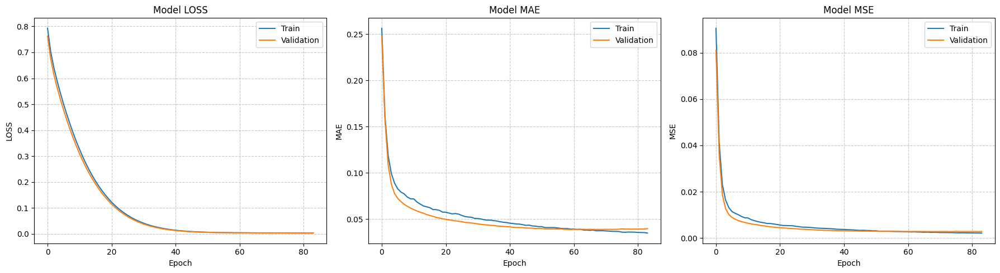


FINAL EVALUATION (Epoch 83)
Loss: 0.004198
MAE:  0.039350
MSE:  0.002792


--- Results for Gameweek 22 ---


,fpl_name,fpl_id,team,position,Actual_xP,Predicted_xP
4434,Bruno G.,488.0,Newcastle,MID,0.0,8.400818
3922,Haaland,430.0,Man City,FWD,0.0,8.147248
1241,Thiago,136.0,Brentford,FWD,0.0,7.943503
947,Collins,106.0,Brentford,DEF,0.0,7.854683
2939,Wilson,329.0,Fulham,MID,0.0,7.828342
...,...,...,...,...,...,...
6631,Bakwa,734.0,Nott'm Forest,MID,0.0,0.777117
1787,Hannibal,207.0,Burnley,MID,0.0,0.758562
431,Bogarde,44.0,Aston Villa,DEF,0.0,0.715027
4218,J.Fletcher,462.0,Man Utd,MID,0.0,0.693597


In [46]:
history_22, evaluation_metrics_22, preds_df_22 = apnn_trainer(active_data_, cols, 22)
# Plot History
plot_training_history(history_22)

# Extract evaluation metrics from the 'best' epoch
# Since restore_best_weights=True, the model's current weights match these metrics
best_epoch = np.argmin(history_22.history['val_loss'])

print("\n" + "="*30)
print(f"FINAL EVALUATION (Epoch {best_epoch + 1})")
print(f"Loss: {history_22.history['val_loss'][best_epoch]:.6f}")
print(f"MAE:  {history_22.history['val_mae'][best_epoch]:.6f}")
print(f"MSE:  {history_22.history['val_mse'][best_epoch]:.6f}")
print("="*30 + "\n")



print(f"\n--- Results for Gameweek {gw} ---")
preds_df_22.sort_values(by='Predicted_xP', ascending=False)#.#head(10).round(2).to_string(index=False))



#### Plots


###### GK


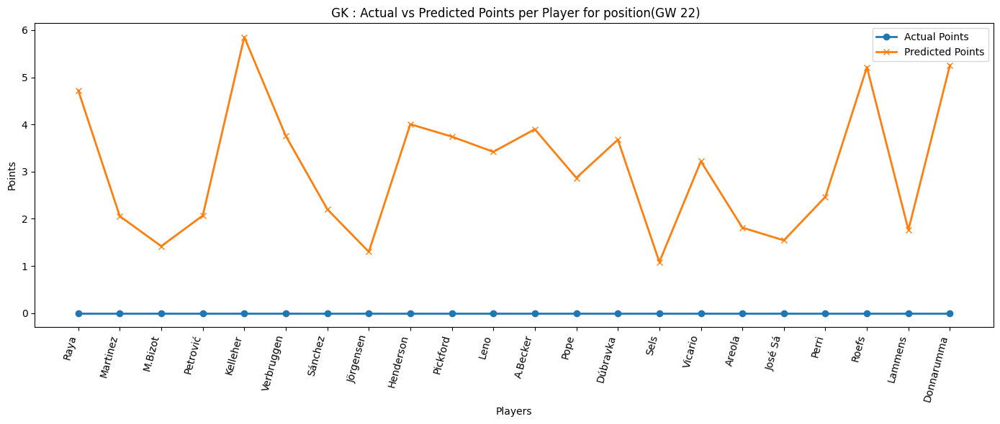

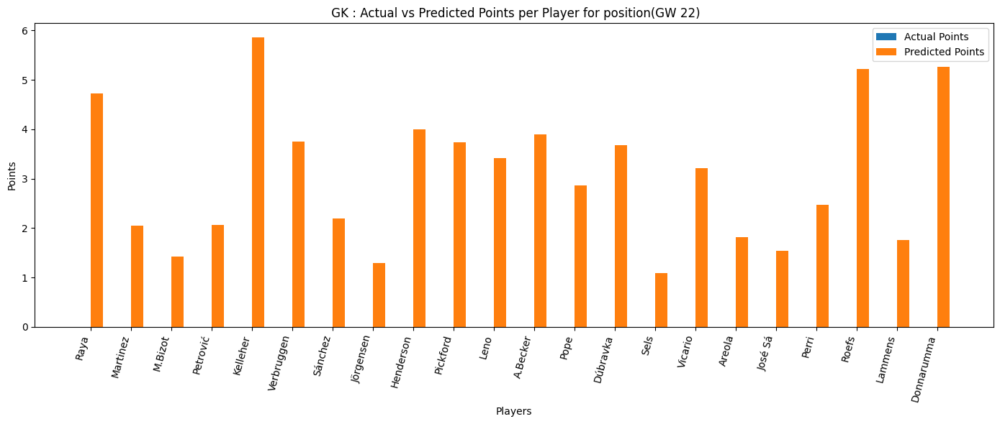

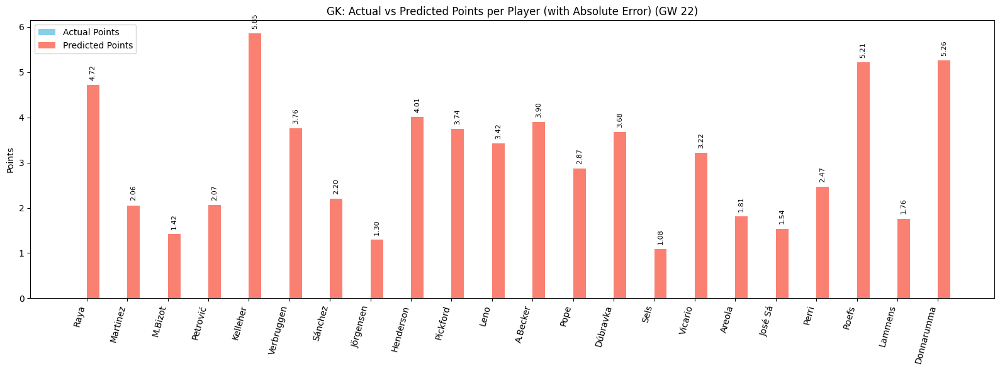

In [47]:
plot_preds(preds_df_22, 'GK', 22)


###### DEF


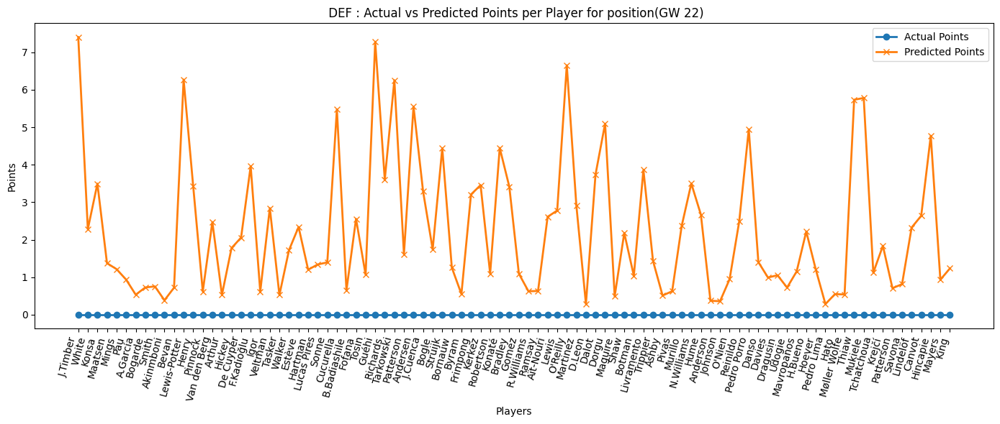

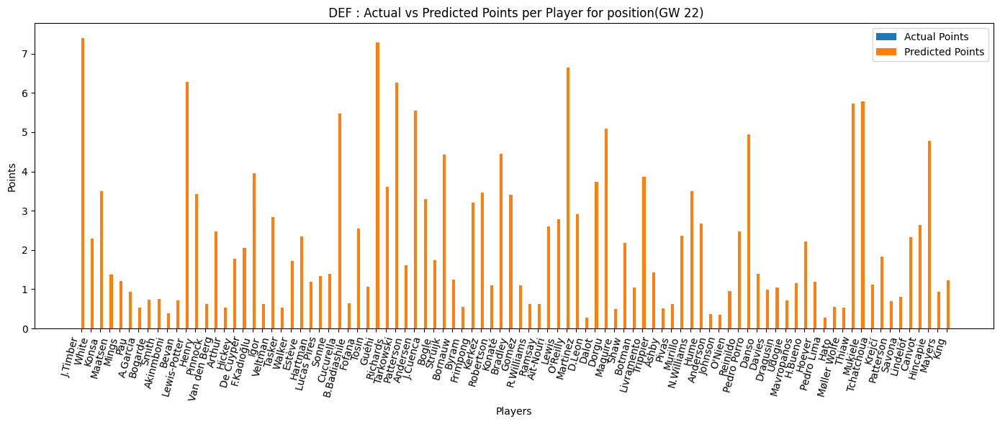

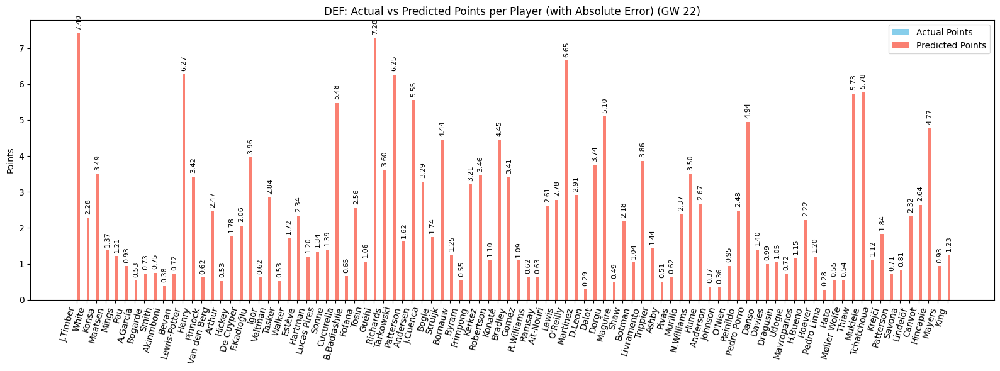

In [35]:
plot_preds(preds_df_22, 'DEF', 22)

###### MID


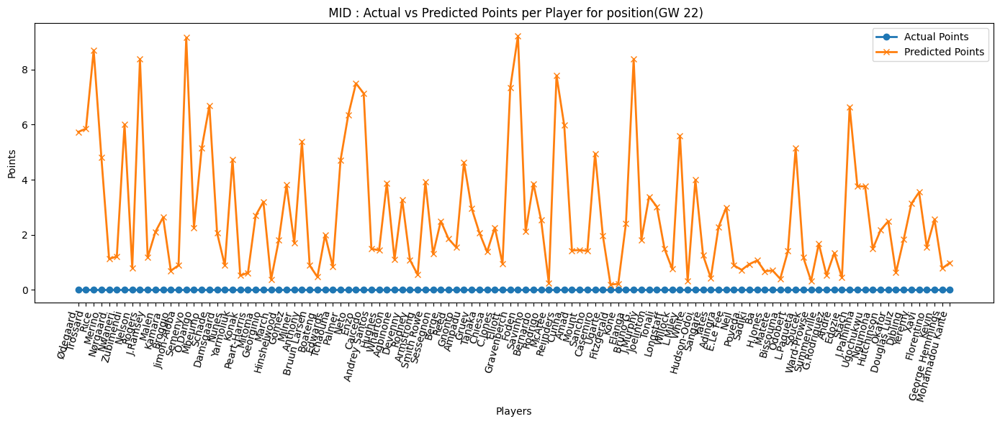

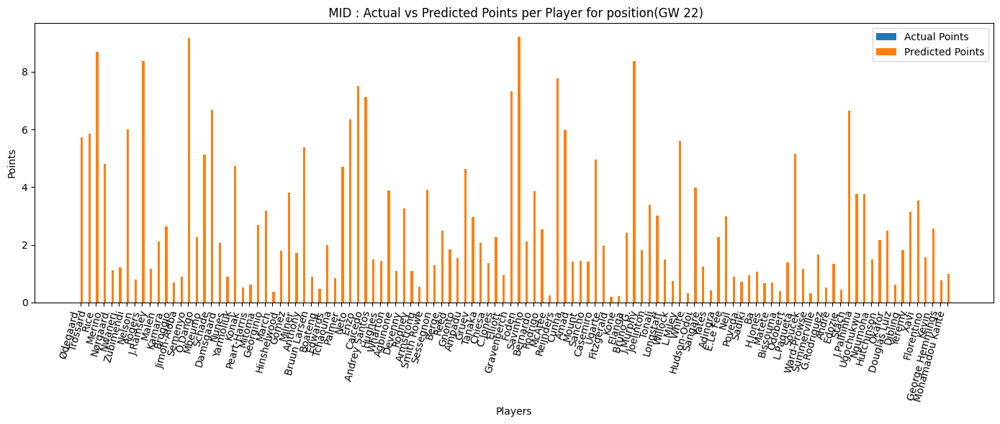

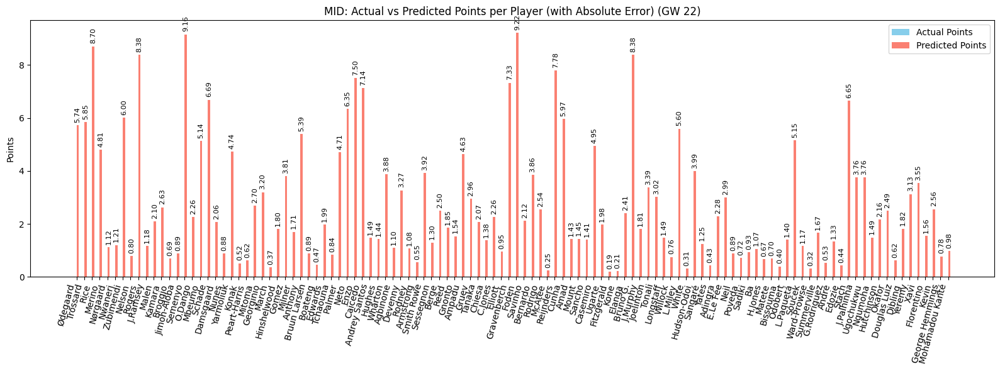

In [36]:
plot_preds(preds_df_22, 'MID', 22)

###### FWD


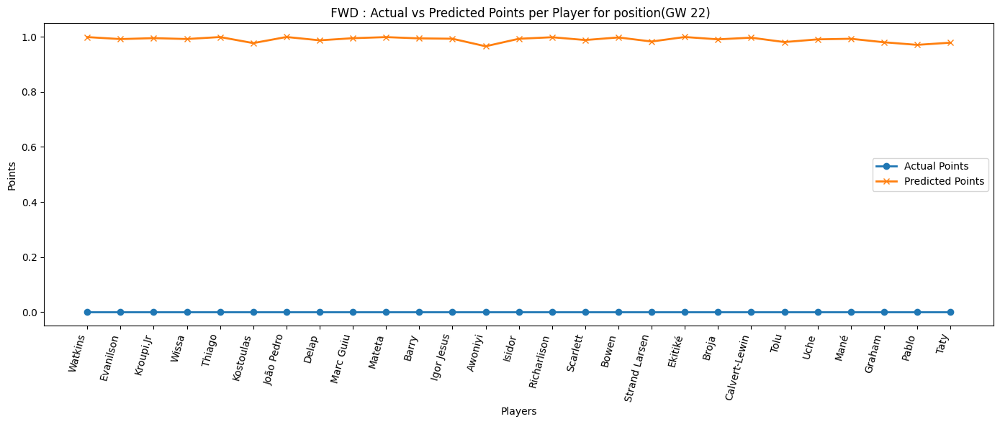

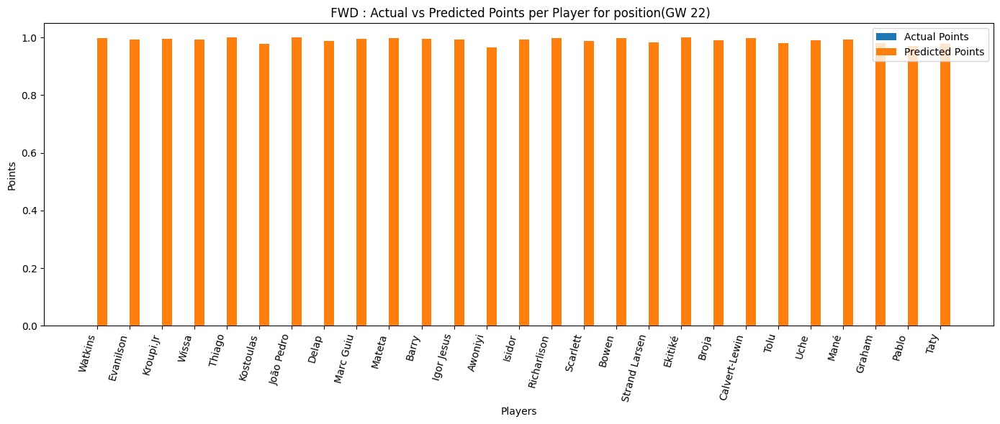

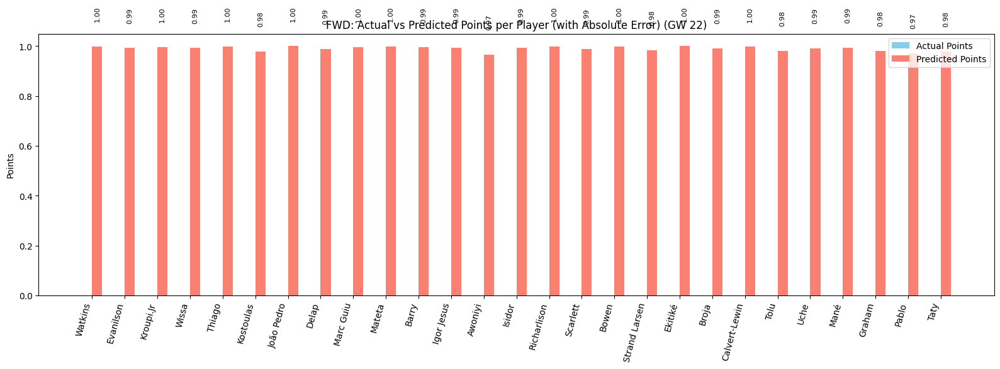

In [103]:
plot_preds(preds_df_22, 'FWD', 22)

# Save Preds


In [63]:
data_info = pd.read_csv('https://raw.githubusercontent.com/ilyandho/FPL-Optimal-Transfer/refs/heads/FantasyGo/Prediction%20with%20Affine%20PNN/data/rolled_player_data.csv')

data_info

,fpl_id,round,first_name,second_name,web_name,now_cost,selected_by_percent,form,event_points,transfers_in_event,...,strength_defence_home_1,strength_defence_home_3,strength_defence_home_5,strength_defence_away_1,strength_defence_away_3,strength_defence_away_5,opponent_team_name,opp_clean_sheets,opp_elo,opp_strength
0,1.0,1,David,Raya Martín,Raya,6.0,36.9,3.2,10.0,418466.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Arsenal,1.0,2037.000000,4.0
1,1.0,2,David,Raya Martín,Raya,5.5,21.5,8.0,6.0,77335.0,...,1290.0,0.0,0.0,1300.0,0.0,0.0,Arsenal,1.0,2037.000000,4.0
2,1.0,3,David,Raya Martín,Raya,5.5,21.8,6.0,2.0,38830.0,...,1290.0,0.0,0.0,1300.0,0.0,0.0,Arsenal,1.0,2037.000000,4.0
3,1.0,4,David,Raya Martín,Raya,5.5,23.5,6.0,6.0,33143.0,...,1290.0,1290.0,0.0,1300.0,1300.0,0.0,Arsenal,1.0,2037.000000,4.0
4,1.0,5,David,Raya Martín,Raya,5.5,24.0,4.0,2.0,95889.0,...,1290.0,1290.0,0.0,1300.0,1300.0,0.0,Arsenal,0.0,2037.000000,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6749,792.0,22,Alysson Edward Franco,da Rocha dos Santos,Alysson,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Aston Villa,0.0,1923.923218,3.0
6750,793.0,22,George,King,King,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Crystal Palace,0.0,1799.602295,3.0
6751,794.0,21,Max,Alleyne,Alleyne,4.5,0.0,4.0,4.0,745.0,...,0.0,0.0,0.0,0.0,0.0,0.0,Man City,0.0,1983.000000,4.0
6752,794.0,22,Max,Alleyne,Alleyne,0.0,0.0,4.0,0.0,0.0,...,1290.0,430.0,258.0,1380.0,460.0,276.0,Man City,0.0,1982.901367,4.0


In [70]:
preds_df_16

,fpl_name,fpl_id,team,position,Actual_xP,Predicted_xP,round
15,Raya,1.0,Arsenal,GK,4.0,5.308048,16
85,J.Timber,8.0,Arsenal,DEF,2.7,3.982289,16
101,Lewis-Skelly,10.0,Arsenal,DEF,1.6,3.056608,16
131,Saka,16.0,Arsenal,MID,7.0,7.657029,16
147,Ødegaard,17.0,Arsenal,MID,2.4,3.467298,16
...,...,...,...,...,...,...,...
6522,Hincapie,725.0,Arsenal,DEF,4.6,7.196295,16
6537,Kolo Muani,726.0,Spurs,FWD,1.6,2.300577,16
6571,Brobbey,730.0,Sunderland,FWD,2.2,2.249975,16
6616,Lammens,733.0,Man Utd,GK,1.8,1.671828,16


In [69]:
preds_df_16['round'] = 16
preds_df_17['round'] = 17
preds_df_18['round'] = 18
preds_df_19['round'] = 19
preds_df_20['round'] = 20
preds_df_21['round'] = 21
preds_df_22['round'] = 22

all_preds = pd.concat([preds_df_16, preds_df_17, preds_df_18, preds_df_19, preds_df_20, preds_df_21, preds_df_22], axis=0)
data_info = data_info.merge(all_preds [['fpl_id', 'round', 'Predicted_xP']], on=['fpl_id', 'round'], how='left')
data_info

,fpl_id,round,first_name,second_name,web_name,now_cost,selected_by_percent,form,event_points,transfers_in_event,...,strength_defence_home_3,strength_defence_home_5,strength_defence_away_1,strength_defence_away_3,strength_defence_away_5,opponent_team_name,opp_clean_sheets,opp_elo,opp_strength,Predicted_xP
0,1.0,1,David,Raya Martín,Raya,6.0,36.9,3.2,10.0,418466.0,...,0.0,0.0,0.0,0.0,0.0,Arsenal,1.0,2037.000000,4.0,NaN
1,1.0,2,David,Raya Martín,Raya,5.5,21.5,8.0,6.0,77335.0,...,0.0,0.0,1300.0,0.0,0.0,Arsenal,1.0,2037.000000,4.0,NaN
2,1.0,3,David,Raya Martín,Raya,5.5,21.8,6.0,2.0,38830.0,...,0.0,0.0,1300.0,0.0,0.0,Arsenal,1.0,2037.000000,4.0,NaN
3,1.0,4,David,Raya Martín,Raya,5.5,23.5,6.0,6.0,33143.0,...,1290.0,0.0,1300.0,1300.0,0.0,Arsenal,1.0,2037.000000,4.0,NaN
4,1.0,5,David,Raya Martín,Raya,5.5,24.0,4.0,2.0,95889.0,...,1290.0,0.0,1300.0,1300.0,0.0,Arsenal,0.0,2037.000000,4.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6749,792.0,22,Alysson Edward Franco,da Rocha dos Santos,Alysson,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,Aston Villa,0.0,1923.923218,3.0,NaN
6750,793.0,22,George,King,King,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,Crystal Palace,0.0,1799.602295,3.0,NaN
6751,794.0,21,Max,Alleyne,Alleyne,4.5,0.0,4.0,4.0,745.0,...,0.0,0.0,0.0,0.0,0.0,Man City,0.0,1983.000000,4.0,NaN
6752,794.0,22,Max,Alleyne,Alleyne,0.0,0.0,4.0,0.0,0.0,...,430.0,258.0,1380.0,460.0,276.0,Man City,0.0,1982.901367,4.0,3.278513
